# Chicago Traffic Crashes
Author: Brenda De Leon
***
## Overview
***
### Business Problem

<img src="https://design.chicago.gov/assets/img/logo/LOGO-CHICAGO-horizontal.png" alt="Chicago logo" title="Chicago Logo" width="150"/>

Traffic deaths are preventable. The City of Chicago has had at least 800,000 yearly reported crash incidents since 2017 and at least 100 yearly reported crash incidents with at least one fatality since 2018. The City of Chicago believes everyone has the right to access to safe streets. However, Chicago has seen a general increase in incidents with at least one fatality over the years even though there has been a general decrease in number of crash incidents. We, the Vision Zero initiative are commited to working with the City of Chicago to eliminate fatalities and serious injuries from traffic crashes. 

Unfortunately, the city resources available to address traffic safety are limited. The Vision Zero will use publicly available crash report data from the most recent complete year (July 2021-June 2022) to predict whether a crash incident would involve injury based on engineered features and determine  which of those features are most important in predicting injury. The Vision Zero will make data backed recommendations, for the City of Chicago, focusing on those features most likely to result in an injury given the limited resources. 

By focusing resources on features most important in predicting injury, the City of Chicago can reduce the likelihood of injury from traffic crashes and improve the safety of streets for everyone. 

### Data

The City of Chicago provides data on reported traffic crash incidents, the datasets have incident data since 2015. 
The following three datasets are provided to be used in conjunction with each other and are regularly updated and available online:

  - [Crashes](https://data.cityofchicago.org/Transportation/Traffic-Crashes-Crashes/85ca-t3if): Information about each traffic crash on city streets within the City of Chicago limits and under the jurisdiction of Chicago Police Department (CPD). 
  - [Vehicles](https://data.cityofchicago.org/Transportation/Traffic-Crashes-Vehicles/68nd-jvt3): Information about units involved in a traffic crash. 
  - [People](https://data.cityofchicago.org/Transportation/Traffic-Crashes-People/u6pd-qa9d): Information about people involved in a crash and if any injuries were sustained.
    
We will use this data to create a machine learning model which will help predict what causes injuries in crash incidents. Our binary classification model will help identify what features are most relevant in crash incident injuries. The model will only utilize data from July 2021-June 2022 to represent a complete recent year and to to provide time for the reporting officer to update the crash report if any new or updated infomation is received so to provide the most informed recommendations. 

##### Data Limitations:
 - The data had nulls and unknowns. Those records related to hit and drive incidents were more likely to have unknown data. Many of the features are recorded by the reporting officer based on best available information at the time. There may be discrepancies in the reporting officer's assesment and the posted information or other assesment. Not all crash incidents are guaranteed to have been recorded.

In [189]:
# importing libraries
import pandas as pd
import numpy as np
from scipy import stats

from sklearn.datasets import make_regression
import matplotlib.pyplot as plt
from matplotlib import ticker
%matplotlib inline

pd.options.mode.chained_assignment = None

import seaborn as sns
color = sns.color_palette()
plt.style.use('seaborn-notebook')
from yellowbrick.regressor import ResidualsPlot
import statsmodels.api as sm
from statsmodels.api import OLS

from pandas_profiling import ProfileReport
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import Ridge, LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split, cross_validate, KFold, cross_val_score, GridSearchCV
from sklearn.dummy import DummyRegressor
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures, OrdinalEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier
from sklearn.metrics import mean_squared_error, make_scorer, r2_score, mean_absolute_error, plot_confusion_matrix, recall_score, accuracy_score, precision_score, f1_score
from matplotlib import pyplot as plt

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImPipeline

#### Crash Dataset

In [190]:
# importing Data
# importing 1 of 3 datasets
crash = pd.read_csv('./data/Traffic_Crashes_-_Crashes.csv')

In [191]:
# viewing columns, # of columns, dtypes, # of rows, # of non nulls 
crash.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 658893 entries, 0 to 658892
Data columns (total 49 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   CRASH_RECORD_ID                658893 non-null  object 
 1   RD_NO                          654560 non-null  object 
 2   CRASH_DATE_EST_I               49948 non-null   object 
 3   CRASH_DATE                     658893 non-null  object 
 4   POSTED_SPEED_LIMIT             658893 non-null  int64  
 5   TRAFFIC_CONTROL_DEVICE         658893 non-null  object 
 6   DEVICE_CONDITION               658893 non-null  object 
 7   WEATHER_CONDITION              658893 non-null  object 
 8   LIGHTING_CONDITION             658893 non-null  object 
 9   FIRST_CRASH_TYPE               658893 non-null  object 
 10  TRAFFICWAY_TYPE                658893 non-null  object 
 11  LANE_CNT                       198992 non-null  float64
 12  ALIGNMENT                     

In [192]:
# inspecting data value ranges
crash.describe()

,POSTED_SPEED_LIMIT,LANE_CNT,STREET_NO,BEAT_OF_OCCURRENCE,NUM_UNITS,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE
count,658893.000000,1.989920e+05,658893.000000,658888.000000,658893.000000,657492.000000,657492.000000,657492.000000,657492.000000,657492.000000,657492.000000,657492.0,658893.000000,658893.000000,658893.000000,654791.000000,654791.000000
mean,28.358427,1.333105e+01,3679.945639,1238.667936,2.034484,0.185135,0.001165,0.019958,0.104243,0.059770,2.008945,0.0,13.221493,4.125547,6.659291,41.854528,-87.673357
std,6.292026,2.961728e+03,2900.200166,705.603150,0.451458,0.558368,0.037103,0.164972,0.415736,0.314293,1.159604,0.0,5.549998,1.981112,3.364697,0.330261,0.670511
min,0.000000,0.000000e+00,0.000000,111.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,1.000000,0.000000,-87.936193
25%,30.000000,2.000000e+00,1232.000000,712.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,9.000000,2.000000,4.000000,41.781171,-87.721377
50%,30.000000,2.000000e+00,3200.000000,1135.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.0,14.000000,4.000000,7.000000,41.874533,-87.673603
75%,30.000000,4.000000e+00,5600.000000,1822.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.0,17.000000,6.000000,9.000000,41.924015,-87.632968
max,99.000000,1.191625e+06,451100.000000,6100.000000,18.000000,21.000000,4.000000,7.000000,21.000000,15.000000,61.000000,0.0,23.000000,7.000000,12.000000,42.022780,0.000000


In [193]:
# checking for duplicates
crash.duplicated().sum()

0

In [194]:
# previewing crash_date format
crash['CRASH_DATE'].value_counts(dropna=False)[:5]

12/29/2020 05:00:00 PM    30
11/10/2017 10:30:00 AM    27
02/17/2022 03:30:00 PM    21
01/12/2019 02:30:00 PM    20
11/10/2017 10:00:00 AM    20
Name: CRASH_DATE, dtype: int64

In [195]:
# creating new column for year
crash['YEAR'] = crash['CRASH_DATE'].str[6:10]

In [196]:
# reviewing incidents per year
crash['YEAR'].value_counts(dropna=False)

2018    118950
2019    117762
2021    108754
2020     92088
2017     83786
2022     83420
2016     44297
2015      9828
2014         6
2013         2
Name: YEAR, dtype: int64

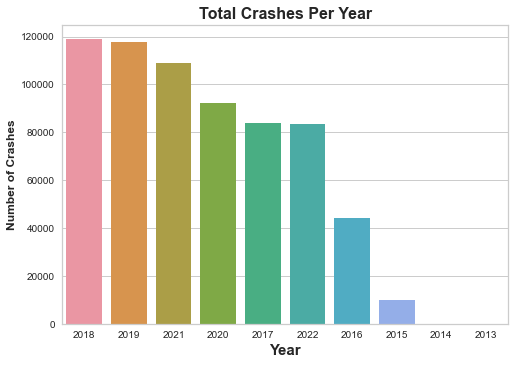

In [197]:
# plotting number of incidents per year
sns.countplot(data=crash, x=crash['YEAR'], order=crash['YEAR'].value_counts().index)
plt.title("Total Crashes Per Year", weight='bold', size=16)
plt.xlabel("Year", weight='bold', size=15),
plt.ylabel("Number of Crashes", weight='bold', size=12);

In [198]:
# reviewing column value counts
crash['INJURIES_FATAL'].value_counts(dropna=False)

0.0    656786
NaN      1401
1.0       655
2.0        43
3.0         7
4.0         1
Name: INJURIES_FATAL, dtype: int64

In [199]:
# calculating number of incidents with at least one fatality in 2017
len(crash.loc[(crash['INJURIES_FATAL'] >0)& (crash['YEAR'] == '2017')])

78

In [200]:
# calculating number of incidents with at least one fatality in 2018
len(crash.loc[(crash['INJURIES_FATAL'] >0)& (crash['YEAR'] == '2018')])

114

In [201]:
# calculating number of incidents with at least one fatality in 2019
len(crash.loc[(crash['INJURIES_FATAL'] >0)& (crash['YEAR'] == '2019')])

102

In [202]:
# calculating number of incidents with at least one fatality in 2020
len(crash.loc[(crash['INJURIES_FATAL'] >0)& (crash['YEAR'] == '2020')])

134

In [203]:
# calculating number of incidents with at least one fatality in 2021
len(crash.loc[(crash['INJURIES_FATAL'] >0)& (crash['YEAR'] == '2021')])

156

In [204]:
# calculating number of incidents with at least one fatality in 2022
len(crash.loc[(crash['INJURIES_FATAL'] >0)& (crash['YEAR'] == '2022')])

105

In [205]:
# creating and applying mask to dataframe to only include incidents from 2021 and 2022
mask = crash['YEAR'].isin(['2021', '2022'])
crash = pd.DataFrame(crash[mask])
print(crash.shape)
crash.head()

(192174, 50)


,CRASH_RECORD_ID,RD_NO,CRASH_DATE_EST_I,CRASH_DATE,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,LANE_CNT,ALIGNMENT,ROADWAY_SURFACE_COND,ROAD_DEFECT,REPORT_TYPE,CRASH_TYPE,INTERSECTION_RELATED_I,NOT_RIGHT_OF_WAY_I,HIT_AND_RUN_I,DAMAGE,DATE_POLICE_NOTIFIED,PRIM_CONTRIBUTORY_CAUSE,SEC_CONTRIBUTORY_CAUSE,STREET_NO,STREET_DIRECTION,STREET_NAME,BEAT_OF_OCCURRENCE,PHOTOS_TAKEN_I,STATEMENTS_TAKEN_I,DOORING_I,WORK_ZONE_I,WORK_ZONE_TYPE,WORKERS_PRESENT_I,NUM_UNITS,MOST_SEVERE_INJURY,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,YEAR
2,0115ade9a755e835255508463f7e9c4a9a0b47e9304238...,JF318029,NaN,07/15/2022 12:45:00 AM,30,UNKNOWN,UNKNOWN,CLEAR,"DARKNESS, LIGHTED ROAD",ANGLE,NOT DIVIDED,NaN,STRAIGHT AND LEVEL,DRY,UNKNOWN,ON SCENE,NO INJURY / DRIVE AWAY,NaN,NaN,NaN,"OVER $1,500",07/15/2022 12:50:00 AM,UNABLE TO DETERMINE,UNABLE TO DETERMINE,300,N,CENTRAL PARK AVE,1123.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0,6,7,41.886336,-87.716203,POINT (-87.716203130599 41.886336409761),2022
3,017040c61958d2fa977c956b2bd2d6759ef7754496dc96...,JF324552,NaN,07/15/2022 06:50:00 PM,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,REAR END,NOT DIVIDED,NaN,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,NaN,NaN,NaN,"OVER $1,500",07/20/2022 11:00:00 AM,UNABLE TO DETERMINE,UNABLE TO DETERMINE,2359,N,ASHLAND AVE,1811.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,18,6,7,41.925111,-87.667997,POINT (-87.667997321599 41.925110815832),2022
5,7943cacbae1bb60e0f056bf53bdaadc0d6092000c19167...,JF330061,NaN,07/24/2022 07:23:00 PM,25,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,ONE-WAY,NaN,STRAIGHT AND LEVEL,DRY,NO DEFECTS,ON SCENE,NO INJURY / DRIVE AWAY,NaN,NaN,NaN,"OVER $1,500",07/24/2022 07:43:00 PM,NOT APPLICABLE,NOT APPLICABLE,2817,W,61ST ST,823.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,1.0,0.0,19,1,7,41.782639,-87.694284,POINT (-87.694283539975 41.782638841451),2022
6,01aaa759c6bbefd0f584226fbd88bdc549de3ed1e46255...,JF319819,NaN,07/15/2022 05:10:00 PM,40,NO CONTROLS,NO CONTROLS,CLOUDY/OVERCAST,DAYLIGHT,ANGLE,DIVIDED - W/MEDIAN BARRIER,NaN,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,NaN,NaN,NaN,"OVER $1,500",07/16/2022 03:20:00 PM,IMPROPER LANE USAGE,NOT APPLICABLE,5100,N,LAKE SHORE DR NB,2024.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,17,6,7,41.975826,-87.650420,POINT (-87.650419778017 41.975826016449),2022
11,01d4adbecb526264f2c84021ba316a8aeb187c5af6d20a...,JF399117,NaN,09/16/2022 10:00:00 PM,35,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",REAR TO FRONT,ALLEY,NaN,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),INJURY AND / OR TOW DUE TO CRASH,NaN,NaN,Y,"OVER $1,500",09/17/2022 12:14:00 AM,UNABLE TO DETERMINE,UNABLE TO DETERMINE,609,N,CLARK ST,1832.0,NaN,NaN,NaN,NaN,NaN,NaN,2,INCAPACITATING INJURY,1.0,0.0,1.0,0.0,0.0,1.0,0.0,22,6,9,41.892676,-87.631008,POINT (-87.631008305478 41.89267582191),2022


In [206]:
# creating new column to only include mm/dd/yyyy
crash['MO_YEAR'] = crash['CRASH_DATE'].str[:10]

In [207]:
# transforming column to datetime format
crash["MO_YEAR"] = pd.to_datetime(crash["MO_YEAR"])

In [208]:
# previewing new column format
crash['MO_YEAR'].value_counts(dropna=False)[:5]

2021-10-29    512
2021-12-10    491
2021-09-17    473
2021-06-19    460
2021-06-04    444
Name: MO_YEAR, dtype: int64

In [209]:
# only keeping incidents dated between 2021-07-01 & 2022-06-30
start_date = '2021-07-01'
end_date = '2022-06-30'
after_start_date = crash['MO_YEAR'] >= start_date
before_end_date = crash['MO_YEAR'] <= end_date
between_two_dates = after_start_date & before_end_date
# filtering rows by dates
crash = crash.loc[between_two_dates]
crash.head()

,CRASH_RECORD_ID,RD_NO,CRASH_DATE_EST_I,CRASH_DATE,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,LANE_CNT,ALIGNMENT,ROADWAY_SURFACE_COND,ROAD_DEFECT,REPORT_TYPE,CRASH_TYPE,INTERSECTION_RELATED_I,NOT_RIGHT_OF_WAY_I,HIT_AND_RUN_I,DAMAGE,DATE_POLICE_NOTIFIED,PRIM_CONTRIBUTORY_CAUSE,SEC_CONTRIBUTORY_CAUSE,STREET_NO,STREET_DIRECTION,STREET_NAME,BEAT_OF_OCCURRENCE,PHOTOS_TAKEN_I,STATEMENTS_TAKEN_I,DOORING_I,WORK_ZONE_I,WORK_ZONE_TYPE,WORKERS_PRESENT_I,NUM_UNITS,MOST_SEVERE_INJURY,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,YEAR,MO_YEAR
44,79e41eed98374f851142153e5755cf25e1cb0b90272297...,JE309181,NaN,07/21/2021 02:40:00 PM,15,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,PARKING LOT,NaN,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,NaN,NaN,Y,"$501 - $1,500",07/21/2021 03:35:00 PM,UNABLE TO DETERMINE,NOT APPLICABLE,2500,N,CENTRAL AVE,2515.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,1.0,0.0,14,4,7,41.925893,-87.766205,POINT (-87.766204825838 41.925892880213),2021,2021-07-21
54,79a9c11b06e5d529811576e6d109e250056fb31724b246...,JE337805,NaN,08/15/2021 02:25:00 AM,30,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",REAR END,NOT DIVIDED,NaN,STRAIGHT AND LEVEL,DRY,NO DEFECTS,ON SCENE,INJURY AND / OR TOW DUE TO CRASH,NaN,NaN,Y,"OVER $1,500",08/15/2021 02:33:00 AM,FOLLOWING TOO CLOSELY,NOT APPLICABLE,5343,N,KEDZIE AVE,1712.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2,1,8,41.978763,-87.708609,POINT (-87.708608839452 41.97876270063),2021,2021-08-15
59,797171f5cf0381d8f840fec2694852b0543e1e4534768b...,JE411881,NaN,10/16/2021 03:15:00 PM,25,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,SIDESWIPE SAME DIRECTION,NOT DIVIDED,NaN,STRAIGHT ON GRADE,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,NaN,NaN,Y,"$501 - $1,500",10/16/2021 04:10:00 PM,UNABLE TO DETERMINE,UNABLE TO DETERMINE,7130,S,RACINE AVE,734.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15,7,10,41.764188,-87.654239,POINT (-87.654239426731 41.764187822199),2021,2021-10-16
67,7bf1fa2ab7bfc4a859cde9f60855597d70e21ea33cf2a7...,JE331509,NaN,08/09/2021 12:10:00 PM,30,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,REAR TO FRONT,NOT DIVIDED,NaN,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,NaN,NaN,NaN,"OVER $1,500",08/09/2021 12:30:00 PM,IMPROPER BACKING,NOT APPLICABLE,3054,S,THROOP ST,913.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,3.0,0.0,12,2,8,41.838393,-87.649919,POINT (-87.649918550512 41.838393259864),2021,2021-08-09
78,7b84b4c4f23715dd6dd9f84ce28dbde18730094f219520...,JE322353,NaN,08/01/2021 03:30:00 PM,30,STOP SIGN/FLASHER,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,REAR END,NOT DIVIDED,NaN,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,Y,NaN,NaN,"OVER $1,500",08/01/2021 04:10:00 PM,FOLLOWING TOO CLOSELY,UNABLE TO DETERMINE,2400,N,CALIFORNIA AVE,1414.0,NaN,NaN,NaN,NaN,NaN,NaN,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15,1,8,41.924896,-87.697562,POINT (-87.69756202078 41.924896284559),2021,2021-08-01


In [210]:
crash.shape

(110104, 51)

In [211]:
# calculating remaining nulls
nulls = crash.isnull().sum()
nulls

CRASH_RECORD_ID                       0
RD_NO                                 0
CRASH_DATE_EST_I                 101673
CRASH_DATE                            0
POSTED_SPEED_LIMIT                    0
TRAFFIC_CONTROL_DEVICE                0
DEVICE_CONDITION                      0
WEATHER_CONDITION                     0
LIGHTING_CONDITION                    0
FIRST_CRASH_TYPE                      0
TRAFFICWAY_TYPE                       0
LANE_CNT                         110086
ALIGNMENT                             0
ROADWAY_SURFACE_COND                  0
ROAD_DEFECT                           0
REPORT_TYPE                        3634
CRASH_TYPE                            0
INTERSECTION_RELATED_I            83781
NOT_RIGHT_OF_WAY_I               105055
HIT_AND_RUN_I                     71988
DAMAGE                                0
DATE_POLICE_NOTIFIED                  0
PRIM_CONTRIBUTORY_CAUSE               0
SEC_CONTRIBUTORY_CAUSE                0
STREET_NO                             0


In [212]:
# calculating null percentage of columns with nulls
null_percent = nulls[nulls>0] / len(crash)
null_percent.sort_values(ascending=False).to_frame('% Null').style.background_gradient(cmap='Reds')

,% Null
LANE_CNT,0.999837
WORKERS_PRESENT_I,0.998638
DOORING_I,0.997303
WORK_ZONE_TYPE,0.996676
WORK_ZONE_I,0.995622
PHOTOS_TAKEN_I,0.988756
STATEMENTS_TAKEN_I,0.979211
NOT_RIGHT_OF_WAY_I,0.954143
CRASH_DATE_EST_I,0.923427
INTERSECTION_RELATED_I,0.760926


In [213]:
# extracting columns with excesssive nulls set at 70%
null_columns = null_percent[null_percent>.70].index.tolist()
null_columns

['CRASH_DATE_EST_I',
 'LANE_CNT',
 'INTERSECTION_RELATED_I',
 'NOT_RIGHT_OF_WAY_I',
 'PHOTOS_TAKEN_I',
 'STATEMENTS_TAKEN_I',
 'DOORING_I',
 'WORK_ZONE_I',
 'WORK_ZONE_TYPE',
 'WORKERS_PRESENT_I']

In [214]:
# shape, preview data and info 
crash = crash.drop(columns = null_columns)
print(crash.shape)
display(crash.head())
crash.info()

(110104, 41)


,CRASH_RECORD_ID,RD_NO,CRASH_DATE,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,ROADWAY_SURFACE_COND,ROAD_DEFECT,REPORT_TYPE,CRASH_TYPE,HIT_AND_RUN_I,DAMAGE,DATE_POLICE_NOTIFIED,PRIM_CONTRIBUTORY_CAUSE,SEC_CONTRIBUTORY_CAUSE,STREET_NO,STREET_DIRECTION,STREET_NAME,BEAT_OF_OCCURRENCE,NUM_UNITS,MOST_SEVERE_INJURY,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,YEAR,MO_YEAR
44,79e41eed98374f851142153e5755cf25e1cb0b90272297...,JE309181,07/21/2021 02:40:00 PM,15,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,PARKING LOT,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,Y,"$501 - $1,500",07/21/2021 03:35:00 PM,UNABLE TO DETERMINE,NOT APPLICABLE,2500,N,CENTRAL AVE,2515.0,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,1.0,0.0,14,4,7,41.925893,-87.766205,POINT (-87.766204825838 41.925892880213),2021,2021-07-21
54,79a9c11b06e5d529811576e6d109e250056fb31724b246...,JE337805,08/15/2021 02:25:00 AM,30,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,ON SCENE,INJURY AND / OR TOW DUE TO CRASH,Y,"OVER $1,500",08/15/2021 02:33:00 AM,FOLLOWING TOO CLOSELY,NOT APPLICABLE,5343,N,KEDZIE AVE,1712.0,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2,1,8,41.978763,-87.708609,POINT (-87.708608839452 41.97876270063),2021,2021-08-15
59,797171f5cf0381d8f840fec2694852b0543e1e4534768b...,JE411881,10/16/2021 03:15:00 PM,25,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,SIDESWIPE SAME DIRECTION,NOT DIVIDED,STRAIGHT ON GRADE,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,Y,"$501 - $1,500",10/16/2021 04:10:00 PM,UNABLE TO DETERMINE,UNABLE TO DETERMINE,7130,S,RACINE AVE,734.0,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15,7,10,41.764188,-87.654239,POINT (-87.654239426731 41.764187822199),2021,2021-10-16
67,7bf1fa2ab7bfc4a859cde9f60855597d70e21ea33cf2a7...,JE331509,08/09/2021 12:10:00 PM,30,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,REAR TO FRONT,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,NaN,"OVER $1,500",08/09/2021 12:30:00 PM,IMPROPER BACKING,NOT APPLICABLE,3054,S,THROOP ST,913.0,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,3.0,0.0,12,2,8,41.838393,-87.649919,POINT (-87.649918550512 41.838393259864),2021,2021-08-09
78,7b84b4c4f23715dd6dd9f84ce28dbde18730094f219520...,JE322353,08/01/2021 03:30:00 PM,30,STOP SIGN/FLASHER,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NOT ON SCENE (DESK REPORT),NO INJURY / DRIVE AWAY,NaN,"OVER $1,500",08/01/2021 04:10:00 PM,FOLLOWING TOO CLOSELY,UNABLE TO DETERMINE,2400,N,CALIFORNIA AVE,1414.0,2,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15,1,8,41.924896,-87.697562,POINT (-87.69756202078 41.924896284559),2021,2021-08-01


<class 'pandas.core.frame.DataFrame'>
Int64Index: 110104 entries, 44 to 658394
Data columns (total 41 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   CRASH_RECORD_ID                110104 non-null  object        
 1   RD_NO                          110104 non-null  object        
 2   CRASH_DATE                     110104 non-null  object        
 3   POSTED_SPEED_LIMIT             110104 non-null  int64         
 4   TRAFFIC_CONTROL_DEVICE         110104 non-null  object        
 5   DEVICE_CONDITION               110104 non-null  object        
 6   WEATHER_CONDITION              110104 non-null  object        
 7   LIGHTING_CONDITION             110104 non-null  object        
 8   FIRST_CRASH_TYPE               110104 non-null  object        
 9   TRAFFICWAY_TYPE                110104 non-null  object        
 10  ALIGNMENT                      110104 non-null  object        
 11 

Columns of the dataset represent: 
    

   - CRASH_RECORD_ID : A unique ID can be used to link to the same crash in the Vehicles and people datasets.
   - RD_NO: Chicago Police Department report number.
   - CRASH_DATE : Date and time of crash.
   - POSTED_SPEED_LIMIT:Posted speed limit.
   - TRAFFIC_CONTROL_DEVICE:Traffic control device present at crash location.
   - DEVICE_CONDITION : Condition of traffic control device.
   - WEATHER_CONDITION : Weather condition at time of crash.
   - LIGHTING_CONDITION: Light condition at time of crasH.
   - FIRST_CRASH_TYPE : Type of first collision in crash.
   - TRAFFICWAY_TYPE : Trafficway type.
   - LANE_CNT : Total number of through lanes in either direction, excluding turn lanes.
   - ALIGNMENT : Street alignment at crash location.
   - ROADWAY_SURFACE_COND:Road surface condition.
   - ROAD_DEFECT : Road defects.
   - REPORT_TYPE : Administrative report type (at scene, at desk, amended).
   - CRASH_TYPE : A general severity classification for the crash. Can be either Injury and/or Tow Due to Crash or No Injury / Drive Away.
   - INTERSECTION_RELATED_I:A field observation by the police officer whether an intersection played a role in the crash. Does not represent whether or not the crash occurred within the intersection.
   - NOT_RIGHT_OF_WAY_I :Whether the crash begun or first contact was made outside of the public right-of-way.
   - HIT_AND_RUN_I : Crash did/did not involve a driver who caused the crash and fled the scene without exchanging information and/or rendering aid.
   - DAMAGE : A field observation of estimated damage.
   - DATE_POLICE_NOTIFIED: Calendar date on which police were notified of the crash.
   - PRIM_CONTRIBUTORY_CAUSE:The factor which was most significant in causing the crash.
   - SEC_CONTRIBUTORY_CAUSE :The factor which was second most significant in causing the crash.
   - STREET_NO :Street address number of crash location.
   - STREET_DIRECTION :Street address direction (N,E,S,W) of crash location.
   - STREET_NAME :Street address name of crash location.
   - BEAT_OF_OCCURRENCE :Chicago Police Department Beat ID.
   - NUM_UNITS :Number of units involved in the crash.
   - MOST_SEVERE_INJURY :Most severe injury sustained by any person involved in the crash.
   - INJURIES_TOTAL :Total persons sustaining fatal, incapacitating, non-incapacitating, and possible injuries.
   - INJURIES_FATAL :Total persons sustaining fatal injuries in the crash.
   - INJURIES_INCAPACITATING:Total persons sustaining incapacitating/serious injuries in the crash. 
   - INJURIES_NON_INCAPACITATING:Total persons sustaining non-incapacitating injuries in the crash.  
   - INJURIES_REPORTED_NOT_EVIDENT:Total persons sustaining possible injuries in the crash.
   - INJURIES_NO_INDICATION:Total persons sustaining no injuries in the crash.
   - INJURIES_UNKNOWN :Total persons for whom injuries sustained, if any, are unknown.
   - CRASH_HOUR :The hour of the day component of CRASH_DATE.
   - CRASH_DAY_OF_WEEK :The day of the week component of CRASH_DATE. Sunday=1
   - CRASH_MONTH :The month component of CRASH_DATE.
   - LATITUDE :The latitude of the crash location.
   - LONGITUDE :The longitude of the crash location.
   - LOCATION :The crash location.



In [215]:
# dropping columns due to irrelevance in predicting a crash incident with injury 
# column description found in: https://data.cityofchicago.org/Transportation/Traffic-Crashes-Crashes/85ca-t3if 
drop = ['RD_NO','CRASH_DATE','REPORT_TYPE', 'DATE_POLICE_NOTIFIED', 'BEAT_OF_OCCURRENCE', 'STREET_NO', 'DAMAGE', 'NUM_UNITS', 'HIT_AND_RUN_I', 'STREET_DIRECTION']

crash = crash.drop(columns = drop)
print(crash.shape)
crash.head()

(110104, 31)


,CRASH_RECORD_ID,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,ROADWAY_SURFACE_COND,ROAD_DEFECT,CRASH_TYPE,PRIM_CONTRIBUTORY_CAUSE,SEC_CONTRIBUTORY_CAUSE,STREET_NAME,MOST_SEVERE_INJURY,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,YEAR,MO_YEAR
44,79e41eed98374f851142153e5755cf25e1cb0b90272297...,15,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,PARKING LOT,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,UNABLE TO DETERMINE,NOT APPLICABLE,CENTRAL AVE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,1.0,0.0,14,4,7,41.925893,-87.766205,POINT (-87.766204825838 41.925892880213),2021,2021-07-21
54,79a9c11b06e5d529811576e6d109e250056fb31724b246...,30,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,INJURY AND / OR TOW DUE TO CRASH,FOLLOWING TOO CLOSELY,NOT APPLICABLE,KEDZIE AVE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2,1,8,41.978763,-87.708609,POINT (-87.708608839452 41.97876270063),2021,2021-08-15
59,797171f5cf0381d8f840fec2694852b0543e1e4534768b...,25,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,SIDESWIPE SAME DIRECTION,NOT DIVIDED,STRAIGHT ON GRADE,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,UNABLE TO DETERMINE,UNABLE TO DETERMINE,RACINE AVE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15,7,10,41.764188,-87.654239,POINT (-87.654239426731 41.764187822199),2021,2021-10-16
67,7bf1fa2ab7bfc4a859cde9f60855597d70e21ea33cf2a7...,30,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,REAR TO FRONT,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,IMPROPER BACKING,NOT APPLICABLE,THROOP ST,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,3.0,0.0,12,2,8,41.838393,-87.649919,POINT (-87.649918550512 41.838393259864),2021,2021-08-09
78,7b84b4c4f23715dd6dd9f84ce28dbde18730094f219520...,30,STOP SIGN/FLASHER,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,FOLLOWING TOO CLOSELY,UNABLE TO DETERMINE,CALIFORNIA AVE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15,1,8,41.924896,-87.697562,POINT (-87.69756202078 41.924896284559),2021,2021-08-01


In [216]:
# preview column values for further inspection using for loop 
for col in crash.columns:
    print(col) 
    print('\n')
    try:
        print(crash[col].value_counts(dropna=False)[:7])
    except: 
        print(crash[col].value_counts(dropna=False))
    print('_________________________________________________________________')

CRASH_RECORD_ID


ca0e068516c518c51d184a31a5eb2b4eb927eeefe0d582184ea3a3980f5dcd1daad33cf0ac00b1a5b09709ff4d90d4848921b140585131f919a35b17e057a2a2    1
863c59e6273695aa79e079478768460bababd778cfb4cf5d601f3792692335e42c1f3dc12ee1b7c4a82008e9146ea79f229344bfefac273e78c045872101317d    1
f77bb47e97df0df08a8d5f3aa076e74d06650512bc8db127cc65f1b50dba8d387bbdb22ceef18ebc3f5ddf21157805d3d5bc3fb46ef1502dc8367452aaf4f3d1    1
9593818ebb2796b02f3a036db68b729158b328cf0462cf61e1e119d2bb7e08444df1d320f47d8f94c3db78d15bc15f650c1a3e93732311eeb3cc7ac6a3748c6e    1
a9eef2ac4b0cd46b87ed57de5401f834e7b20adaa1c368ed167b5f10f52ca40202834bfdeab1f7ffb30d4075747e3fbbf7101305795f326afc54c49198b285d2    1
d47e6ea50be08706ec786dede236dfe5c1678088a5433615e15e4f4a800d4f0a6a231d02432fa7443b0d72f6e47a39ad4c3b366d3bb28541965689cd2cfbd902    1
afd3a76ef80ee7c3ac6c87a19dbaf0719b28f2b1cee5a13595e5a0500978a78ae25b285a995b9a7049630c761848cb09b8a0801998b0dd3e7294cb0cb7fdf219    1
Name: CRASH_RECORD_ID, dtype: int64
________

 NaN          919
-87.905309    246
-87.619928    119
-87.580148     96
-87.585276     61
-87.585972     58
-87.741385     53
-87.631515     50
-87.617636     48
-87.617027     45
-87.624306     43
-87.625588     42
-87.624235     39
-87.742436     39
-87.576639     36
-87.627509     35
-87.617576     35
-87.641565     34
-87.585592     33
-87.638634     31
-87.585783     30
-87.626918     30
-87.643145     30
-87.684571     30
-87.741646     30
-87.702540     30
-87.655389     29
-87.741486     29
-87.723851     29
-87.585632     29
-87.743297     29
-87.646640     28
-87.586470     28
-87.589371     28
-87.704119     28
-87.743537     28
-87.618904     28
-87.629065     28
-87.566899     27
-87.559433     27
-87.741753     26
-87.611570     26
-87.676864     26
-87.586234     26
-87.722499     26
-87.645342     25
-87.685013     25
-87.636663     25
-87.743376     25
-87.743612     25
-87.684175     25
-87.632181     25
-87.608750     24
-87.630100     24
-87.618738     24
-87.644328

In [217]:
# check for remaining nulls
crash.isnull().sum()

CRASH_RECORD_ID                    0
POSTED_SPEED_LIMIT                 0
TRAFFIC_CONTROL_DEVICE             0
DEVICE_CONDITION                   0
WEATHER_CONDITION                  0
LIGHTING_CONDITION                 0
FIRST_CRASH_TYPE                   0
TRAFFICWAY_TYPE                    0
ALIGNMENT                          0
ROADWAY_SURFACE_COND               0
ROAD_DEFECT                        0
CRASH_TYPE                         0
PRIM_CONTRIBUTORY_CAUSE            0
SEC_CONTRIBUTORY_CAUSE             0
STREET_NAME                        0
MOST_SEVERE_INJURY               271
INJURIES_TOTAL                   271
INJURIES_FATAL                   271
INJURIES_INCAPACITATING          271
INJURIES_NON_INCAPACITATING      271
INJURIES_REPORTED_NOT_EVIDENT    271
INJURIES_NO_INDICATION           271
INJURIES_UNKNOWN                 271
CRASH_HOUR                         0
CRASH_DAY_OF_WEEK                  0
CRASH_MONTH                        0
LATITUDE                         919
L

##### Multicollinearity

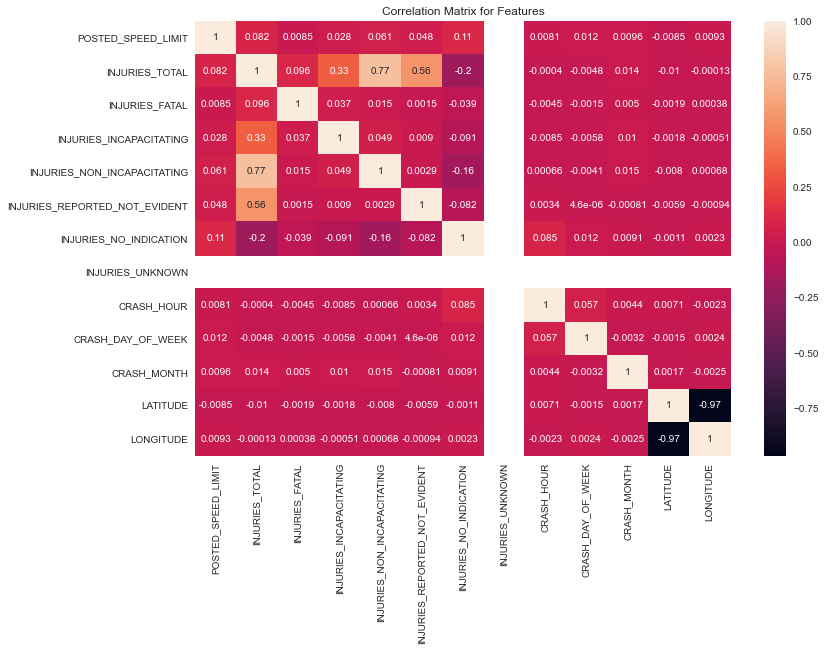

In [218]:
# matrix to check for correlation between all columns 
plt.figure(figsize=(12,8))
sns.heatmap(crash.corr(), annot=True)

plt.title('Correlation Matrix for Features')
plt.savefig("corrmatrix.jpg", dpi = 300)
plt.show()

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

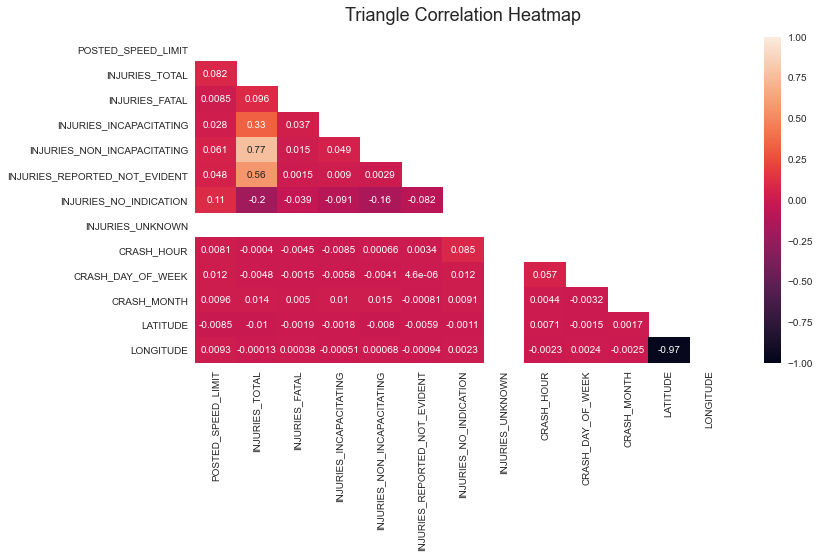

In [219]:
# creating mask to show only one side of the matrix
plt.figure(figsize=(12,6))
mask = np.triu(np.ones_like(crash.corr(), dtype=bool))
heatmap = sns.heatmap(crash.corr(), mask=mask, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

##### Multicollinearity amongst the injury related columns will be resolved after the target feature is selected. The redundant injury columns will be dropped. 

In [220]:
len(crash['CRASH_RECORD_ID'])

110104

In [221]:
# comparing unique values for duplicate check
len(crash['CRASH_RECORD_ID'].unique())

110104

### Vehicle Dataset

In [222]:
# importing 2 of 3 datasets
vehicle = pd.read_csv('./data/Traffic_Crashes_-_Vehicles.csv', low_memory=False)

In [223]:
# viewing columns, # of columns, dtypes, # of rows, # of non nulls
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1342788 entries, 0 to 1342787
Data columns (total 72 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   CRASH_UNIT_ID             1342788 non-null  int64  
 1   CRASH_RECORD_ID           1342788 non-null  object 
 2   RD_NO                     1333946 non-null  object 
 3   CRASH_DATE                1342788 non-null  object 
 4   UNIT_NO                   1342788 non-null  int64  
 5   UNIT_TYPE                 1340916 non-null  object 
 6   NUM_PASSENGERS            199446 non-null   float64
 7   VEHICLE_ID                1312308 non-null  float64
 8   CMRC_VEH_I                25049 non-null    object 
 9   MAKE                      1312303 non-null  object 
 10  MODEL                     1312159 non-null  object 
 11  LIC_PLATE_STATE           1193673 non-null  object 
 12  VEHICLE_YEAR              1098606 non-null  float64
 13  VEHICLE_DEFECT            1

In [224]:
# inspecting data value ranges
vehicle.describe()

,CRASH_UNIT_ID,UNIT_NO,NUM_PASSENGERS,VEHICLE_ID,VEHICLE_YEAR,OCCUPANT_CNT,CMV_ID,TRAILER1_LENGTH,TRAILER2_LENGTH,TOTAL_VEHICLE_LENGTH,AXLE_CNT
count,1.342788e+06,1.342788e+06,199446.000000,1.312308e+06,1.098606e+06,1.312308e+06,14102.000000,2127.000000,61.000000,2583.000000,3799.000000
mean,7.177985e+05,4.377577e+00,1.471591,6.828118e+05,2.013631e+03,1.079599e+00,7870.090484,48.514339,44.426230,53.170732,10.587786
std,4.163950e+05,3.260334e+03,1.050469,3.939260e+05,1.437242e+02,7.841403e-01,4564.723314,21.486014,28.274523,31.889974,421.926907
min,2.000000e+00,0.000000e+00,1.000000,2.000000e+00,1.900000e+03,0.000000e+00,1.000000,1.000000,2.000000,1.000000,1.000000
25%,3.558938e+05,1.000000e+00,1.000000,3.419718e+05,2.006000e+03,1.000000e+00,3893.250000,45.000000,24.000000,35.000000,2.000000
50%,7.190395e+05,2.000000e+00,1.000000,6.832485e+05,2.012000e+03,1.000000e+00,7889.500000,53.000000,48.000000,53.000000,3.000000
75%,1.079035e+06,2.000000e+00,2.000000,1.023560e+06,2.016000e+03,1.000000e+00,11838.750000,53.000000,53.000000,66.000000,5.000000
max,1.437848e+06,3.778035e+06,59.000000,1.366504e+06,9.999000e+03,9.900000e+01,15740.000000,740.000000,123.000000,999.000000,26009.000000


In [225]:
# checking for duplicates
vehicle.duplicated().sum()

0

In [226]:
# creating new column to only include mm/dd/yyyy
vehicle['MO_YEAR'] = vehicle['CRASH_DATE'].str[:10]

In [227]:
# transforming column to datetime format
vehicle['MO_YEAR'] = pd.to_datetime(vehicle['MO_YEAR'])

In [228]:
# previewing new column format
vehicle['MO_YEAR'].value_counts(dropna=False)[:5]

2019-01-12    1175
2020-02-14    1161
2017-11-10    1149
2019-11-12    1135
2021-10-29    1029
Name: MO_YEAR, dtype: int64

In [229]:
# only keeping incidents dated between 2021-07-01 & 2022-06-30
start_date = '2021-07-01'
end_date = '2022-06-30'
after_start_date = vehicle['MO_YEAR'] >= start_date
before_end_date = vehicle['MO_YEAR'] <= end_date
between_two_dates = after_start_date & before_end_date
# filtering rows by dates
vehicle = vehicle.loc[between_two_dates]
vehicle.head()

,CRASH_UNIT_ID,CRASH_RECORD_ID,RD_NO,CRASH_DATE,UNIT_NO,UNIT_TYPE,NUM_PASSENGERS,VEHICLE_ID,CMRC_VEH_I,MAKE,MODEL,LIC_PLATE_STATE,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,TRAVEL_DIRECTION,MANEUVER,TOWED_I,FIRE_I,OCCUPANT_CNT,EXCEED_SPEED_LIMIT_I,TOWED_BY,TOWED_TO,AREA_00_I,AREA_01_I,AREA_02_I,AREA_03_I,AREA_04_I,AREA_05_I,AREA_06_I,AREA_07_I,AREA_08_I,AREA_09_I,AREA_10_I,AREA_11_I,AREA_12_I,AREA_99_I,FIRST_CONTACT_POINT,CMV_ID,USDOT_NO,CCMC_NO,ILCC_NO,COMMERCIAL_SRC,GVWR,CARRIER_NAME,CARRIER_STATE,CARRIER_CITY,HAZMAT_PLACARDS_I,HAZMAT_NAME,UN_NO,HAZMAT_PRESENT_I,HAZMAT_REPORT_I,HAZMAT_REPORT_NO,MCS_REPORT_I,MCS_REPORT_NO,HAZMAT_VIO_CAUSE_CRASH_I,MCS_VIO_CAUSE_CRASH_I,IDOT_PERMIT_NO,WIDE_LOAD_I,TRAILER1_WIDTH,TRAILER2_WIDTH,TRAILER1_LENGTH,TRAILER2_LENGTH,TOTAL_VEHICLE_LENGTH,AXLE_CNT,VEHICLE_CONFIG,CARGO_BODY_TYPE,LOAD_TYPE,HAZMAT_OUT_OF_SERVICE_I,MCS_OUT_OF_SERVICE_I,HAZMAT_CLASS,MO_YEAR
47,1345265,dbac8428754f20709146eb639a916d724b22e4fe77e3b6...,JF256544,05/26/2022 02:50:00 PM,1,DRIVER,NaN,1278104.0,NaN,BLUEBIRD INTERNATIONAL,BLUEBIRD INTERNATIONAL,IL,2015.0,NONE,BUS OVER 15 PASS.,SCHOOL BUS,N,PASSING/OVERTAKING,NaN,NaN,1.0,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,FRONT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-05-26
48,1345266,dbac8428754f20709146eb639a916d724b22e4fe77e3b6...,JF256544,05/26/2022 02:50:00 PM,2,DRIVER,NaN,1278111.0,NaN,TOYOTA,CAMRY,IL,2018.0,NONE,PASSENGER,PERSONAL,N,STRAIGHT AHEAD,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,NaN,NaN,NaN,ROOF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-05-26
114,1175117,b4f83199e38e51daad783fd12792c4ba5fb9b782fcb48b...,JE358387,09/01/2021 08:30:00 PM,2,PARKED,NaN,1114778.0,N,GENERAL MOTORS CORPORATION (GMC),SIERRA,IL,2018.0,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,UNKNOWN,PARKED,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,NaN,OTHER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-09-01
115,1175118,b4f83199e38e51daad783fd12792c4ba5fb9b782fcb48b...,JE358387,09/01/2021 08:30:00 PM,1,DRIVER,NaN,1114794.0,NaN,UNKNOWN,OTHER (EXPLAIN IN NARRATIVE),NaN,NaN,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,UNKNOWN,UNKNOWN/NA,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,UNKNOWN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-09-01
138,1179488,f59ed556b017e61ebf51d01215608c052d1496d661b2e5...,JE366449,09/08/2021 06:12:00 PM,1,DRIVER,NaN,1118989.0,NaN,TOYOTA,COROLLA,IL,2013.0,UNKNOWN,PASSENGER,UNKNOWN/NA,N,PASSING/OVERTAKING,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,REAR-RIGHT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-09-08


In [230]:
vehicle.shape

(224548, 73)

In [231]:
# calculating remaining nulls
nulls = vehicle.isnull().sum()
nulls

CRASH_UNIT_ID                    0
CRASH_RECORD_ID                  0
RD_NO                            0
CRASH_DATE                       0
UNIT_NO                          0
UNIT_TYPE                      262
NUM_PASSENGERS              192097
VEHICLE_ID                    4736
CMRC_VEH_I                  220282
MAKE                          4736
MODEL                         4736
LIC_PLATE_STATE              27867
VEHICLE_YEAR                 41017
VEHICLE_DEFECT                4736
VEHICLE_TYPE                  4736
VEHICLE_USE                   4736
TRAVEL_DIRECTION              4736
MANEUVER                      4736
TOWED_I                     191577
FIRE_I                      224311
OCCUPANT_CNT                  4736
EXCEED_SPEED_LIMIT_I        224541
TOWED_BY                    199007
TOWED_TO                    209419
AREA_00_I                   218540
AREA_01_I                   162522
AREA_02_I                   193781
AREA_03_I                   203129
AREA_04_I           

In [232]:
# calculating null percentage of columns with nulls
null_percent = nulls[nulls>0] / len(vehicle)
null_percent.sort_values(ascending=False).to_frame('% Null').style.background_gradient(cmap='Reds')

,% Null
HAZMAT_REPORT_NO,1.000000
MCS_REPORT_NO,1.000000
EXCEED_SPEED_LIMIT_I,0.999969
HAZMAT_NAME,0.999964
TRAILER2_LENGTH,0.999964
WIDE_LOAD_I,0.999915
HAZMAT_PLACARDS_I,0.999835
TRAILER2_WIDTH,0.999817
UN_NO,0.999737
IDOT_PERMIT_NO,0.999506


In [233]:
# extracting columns with excessive nulls set at 70%
null_columns = null_percent[null_percent>.70].index.tolist()
null_columns

['NUM_PASSENGERS',
 'CMRC_VEH_I',
 'TOWED_I',
 'FIRE_I',
 'EXCEED_SPEED_LIMIT_I',
 'TOWED_BY',
 'TOWED_TO',
 'AREA_00_I',
 'AREA_01_I',
 'AREA_02_I',
 'AREA_03_I',
 'AREA_04_I',
 'AREA_05_I',
 'AREA_06_I',
 'AREA_07_I',
 'AREA_08_I',
 'AREA_09_I',
 'AREA_10_I',
 'AREA_11_I',
 'AREA_12_I',
 'AREA_99_I',
 'CMV_ID',
 'USDOT_NO',
 'CCMC_NO',
 'ILCC_NO',
 'COMMERCIAL_SRC',
 'GVWR',
 'CARRIER_NAME',
 'CARRIER_STATE',
 'CARRIER_CITY',
 'HAZMAT_PLACARDS_I',
 'HAZMAT_NAME',
 'UN_NO',
 'HAZMAT_PRESENT_I',
 'HAZMAT_REPORT_I',
 'HAZMAT_REPORT_NO',
 'MCS_REPORT_I',
 'MCS_REPORT_NO',
 'HAZMAT_VIO_CAUSE_CRASH_I',
 'MCS_VIO_CAUSE_CRASH_I',
 'IDOT_PERMIT_NO',
 'WIDE_LOAD_I',
 'TRAILER1_WIDTH',
 'TRAILER2_WIDTH',
 'TRAILER1_LENGTH',
 'TRAILER2_LENGTH',
 'TOTAL_VEHICLE_LENGTH',
 'AXLE_CNT',
 'VEHICLE_CONFIG',
 'CARGO_BODY_TYPE',
 'LOAD_TYPE',
 'HAZMAT_OUT_OF_SERVICE_I',
 'MCS_OUT_OF_SERVICE_I',
 'HAZMAT_CLASS']

In [234]:
# dropping columns with excessive nulls
# confirming df shape, data and info 
vehicle = vehicle.drop(columns = null_columns)
print(vehicle.shape)
display(vehicle.head())
vehicle.info()

(224548, 19)


,CRASH_UNIT_ID,CRASH_RECORD_ID,RD_NO,CRASH_DATE,UNIT_NO,UNIT_TYPE,VEHICLE_ID,MAKE,MODEL,LIC_PLATE_STATE,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,TRAVEL_DIRECTION,MANEUVER,OCCUPANT_CNT,FIRST_CONTACT_POINT,MO_YEAR
47,1345265,dbac8428754f20709146eb639a916d724b22e4fe77e3b6...,JF256544,05/26/2022 02:50:00 PM,1,DRIVER,1278104.0,BLUEBIRD INTERNATIONAL,BLUEBIRD INTERNATIONAL,IL,2015.0,NONE,BUS OVER 15 PASS.,SCHOOL BUS,N,PASSING/OVERTAKING,1.0,FRONT,2022-05-26
48,1345266,dbac8428754f20709146eb639a916d724b22e4fe77e3b6...,JF256544,05/26/2022 02:50:00 PM,2,DRIVER,1278111.0,TOYOTA,CAMRY,IL,2018.0,NONE,PASSENGER,PERSONAL,N,STRAIGHT AHEAD,1.0,ROOF,2022-05-26
114,1175117,b4f83199e38e51daad783fd12792c4ba5fb9b782fcb48b...,JE358387,09/01/2021 08:30:00 PM,2,PARKED,1114778.0,GENERAL MOTORS CORPORATION (GMC),SIERRA,IL,2018.0,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,UNKNOWN,PARKED,0.0,OTHER,2021-09-01
115,1175118,b4f83199e38e51daad783fd12792c4ba5fb9b782fcb48b...,JE358387,09/01/2021 08:30:00 PM,1,DRIVER,1114794.0,UNKNOWN,OTHER (EXPLAIN IN NARRATIVE),NaN,NaN,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,UNKNOWN,UNKNOWN/NA,1.0,UNKNOWN,2021-09-01
138,1179488,f59ed556b017e61ebf51d01215608c052d1496d661b2e5...,JE366449,09/08/2021 06:12:00 PM,1,DRIVER,1118989.0,TOYOTA,COROLLA,IL,2013.0,UNKNOWN,PASSENGER,UNKNOWN/NA,N,PASSING/OVERTAKING,1.0,REAR-RIGHT,2021-09-08


<class 'pandas.core.frame.DataFrame'>
Int64Index: 224548 entries, 47 to 1340754
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   CRASH_UNIT_ID        224548 non-null  int64         
 1   CRASH_RECORD_ID      224548 non-null  object        
 2   RD_NO                224548 non-null  object        
 3   CRASH_DATE           224548 non-null  object        
 4   UNIT_NO              224548 non-null  int64         
 5   UNIT_TYPE            224286 non-null  object        
 6   VEHICLE_ID           219812 non-null  float64       
 7   MAKE                 219812 non-null  object        
 8   MODEL                219812 non-null  object        
 9   LIC_PLATE_STATE      196681 non-null  object        
 10  VEHICLE_YEAR         183531 non-null  float64       
 11  VEHICLE_DEFECT       219812 non-null  object        
 12  VEHICLE_TYPE         219812 non-null  object        
 13  VEHICLE_USE 

Column Description

- CRASH_UNIT_ID : A unique identifier for each vehicle record.

 - CRASH_RECORD_ID : This number can be used to link to the same crash in the Crashes and People datasets. This number also serves as a unique ID in the Crashes dataset.

 - RD_NO : Chicago Police Department report number. For privacy reasons, this column is blank for recent crashes.

 - CRASH_DATE : Date and time of crash as entered by the reporting officer

 - UNIT_NO	: A unique ID for each unit within a specific crash report.

 - UNIT_TYPE : The type of unit
 
 - VEHICLE_ID: definition missing

 - MAKE : The make (brand) of the vehicle, if relevant

 - MODEL : The model of the vehicle, if relevant

 - LIC_PLATE_STATE : The state issuing the license plate of the vehicle, if relevant

 - VEHICLE_YEAR : The model year of the vehicle, if relevant

 - VEHICLE_DEFECT : definition missing

 - VEHICLE_TYPE : The type of vehicle, if relevant

 - VEHICLE_USE : The normal use of the vehicle, if relevant

 - TRAVEL_DIRECTION : The direction in which the unit was traveling prior to the crash, as determined by the reporting officer

 - MANEUVER : The action the unit was taking prior to the crash, as determined by the reporting officer

 - OCCUPANT_CNT: The number of people in the unit, as determined by the reporting officer

 - FIRST_CONTACT_POINT: definition missing

 - MO_YEAR: we created this column

In [235]:
# dropping columns due to irrelevance in predicting a car crash incident with injury 
# column description found in: https://data.cityofchicago.org/Transportation/Traffic-Crashes-Vehicles/68nd-jvt3
drop = ['RD_NO', 'CRASH_DATE', 'UNIT_NO', 'LIC_PLATE_STATE', 'CRASH_DATE', 'TRAVEL_DIRECTION', 'MO_YEAR']

vehicle = vehicle.drop(columns = drop)
print(vehicle.shape)
vehicle.head()

(224548, 13)


,CRASH_UNIT_ID,CRASH_RECORD_ID,UNIT_TYPE,VEHICLE_ID,MAKE,MODEL,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,MANEUVER,OCCUPANT_CNT,FIRST_CONTACT_POINT
47,1345265,dbac8428754f20709146eb639a916d724b22e4fe77e3b6...,DRIVER,1278104.0,BLUEBIRD INTERNATIONAL,BLUEBIRD INTERNATIONAL,2015.0,NONE,BUS OVER 15 PASS.,SCHOOL BUS,PASSING/OVERTAKING,1.0,FRONT
48,1345266,dbac8428754f20709146eb639a916d724b22e4fe77e3b6...,DRIVER,1278111.0,TOYOTA,CAMRY,2018.0,NONE,PASSENGER,PERSONAL,STRAIGHT AHEAD,1.0,ROOF
114,1175117,b4f83199e38e51daad783fd12792c4ba5fb9b782fcb48b...,PARKED,1114778.0,GENERAL MOTORS CORPORATION (GMC),SIERRA,2018.0,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,PARKED,0.0,OTHER
115,1175118,b4f83199e38e51daad783fd12792c4ba5fb9b782fcb48b...,DRIVER,1114794.0,UNKNOWN,OTHER (EXPLAIN IN NARRATIVE),NaN,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,UNKNOWN/NA,1.0,UNKNOWN
138,1179488,f59ed556b017e61ebf51d01215608c052d1496d661b2e5...,DRIVER,1118989.0,TOYOTA,COROLLA,2013.0,UNKNOWN,PASSENGER,UNKNOWN/NA,PASSING/OVERTAKING,1.0,REAR-RIGHT


In [236]:
# preview column values for further inspection using for loop 
columns=['UNIT_TYPE', 'MAKE', 'MODEL', 'VEHICLE_YEAR', 'VEHICLE_DEFECT', 'VEHICLE_TYPE', 'VEHICLE_USE', 'MANEUVER', 'OCCUPANT_CNT', 'FIRST_CONTACT_POINT']
for i in columns:
    print(i) 
    print('\n')
    try:
        print(vehicle[i].value_counts(dropna=False)[:10])
    except: 
        print(vehicle[i].value_counts(dropna=False))
    print('_________________________________________________________________')

UNIT_TYPE


DRIVER                 186766
PARKED                  31425
PEDESTRIAN               2594
BICYCLE                  1651
DRIVERLESS               1612
NaN                       262
NON-MOTOR VEHICLE         141
DISABLED VEHICLE           58
NON-CONTACT VEHICLE        38
EQUESTRIAN                  1
Name: UNIT_TYPE, dtype: int64
_________________________________________________________________
MAKE


CHEVROLET    25207
TOYOTA       23023
UNKNOWN      22385
FORD         21775
NISSAN       17650
HONDA        16524
JEEP          9915
HYUNDAI       9579
DODGE         9219
KIA           6393
Name: MAKE, dtype: int64
_________________________________________________________________
MODEL


OTHER (EXPLAIN IN NARRATIVE)    39200
CAMRY                            6297
MOTORIZED                        5189
NaN                              4736
ALTIMA                           4403
COROLLA                          4389
CIVIC                            4200
MALIBU                        

In [237]:
# calculating remaining nulls
vehicle.isnull().sum()

CRASH_UNIT_ID              0
CRASH_RECORD_ID            0
UNIT_TYPE                262
VEHICLE_ID              4736
MAKE                    4736
MODEL                   4736
VEHICLE_YEAR           41017
VEHICLE_DEFECT          4736
VEHICLE_TYPE            4736
VEHICLE_USE             4736
MANEUVER                4736
OCCUPANT_CNT            4736
FIRST_CONTACT_POINT     7921
dtype: int64

In [238]:
# dropping all remaining nulls since all except VEHICLE_YEAR was .02 or less null. Will likely drop VEHICLE_YEAR given the many incorrect values.
vehicle.dropna(inplace=True)
vehicle.isnull().sum()

CRASH_UNIT_ID          0
CRASH_RECORD_ID        0
UNIT_TYPE              0
VEHICLE_ID             0
MAKE                   0
MODEL                  0
VEHICLE_YEAR           0
VEHICLE_DEFECT         0
VEHICLE_TYPE           0
VEHICLE_USE            0
MANEUVER               0
OCCUPANT_CNT           0
FIRST_CONTACT_POINT    0
dtype: int64

In [239]:
# comparing unique values for duplicate check
print(len(vehicle['CRASH_RECORD_ID']))
len(vehicle['CRASH_RECORD_ID'].unique())

180664


103734

In [240]:
# comparing unique values for duplicate check
print(len(vehicle['CRASH_UNIT_ID']))
len(vehicle['CRASH_UNIT_ID'].unique())

180664


180664

In [241]:
# comparing unique values for duplicate check
print(len(vehicle['VEHICLE_ID']))
len(vehicle['VEHICLE_ID'].unique())

180664


180664

##### duplicate crash record ids show that there were several incidents where more than one involved unit has submitted a report
##### lack of duplicate crash unit id and vehicle id show that no unit has duplicate records despite the duplicate crash record ids

In [242]:
# viewing columns, # of columns, dtypes, # of rows, # of non nulls
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 180664 entries, 47 to 1340754
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   CRASH_UNIT_ID        180664 non-null  int64  
 1   CRASH_RECORD_ID      180664 non-null  object 
 2   UNIT_TYPE            180664 non-null  object 
 3   VEHICLE_ID           180664 non-null  float64
 4   MAKE                 180664 non-null  object 
 5   MODEL                180664 non-null  object 
 6   VEHICLE_YEAR         180664 non-null  float64
 7   VEHICLE_DEFECT       180664 non-null  object 
 8   VEHICLE_TYPE         180664 non-null  object 
 9   VEHICLE_USE          180664 non-null  object 
 10  MANEUVER             180664 non-null  object 
 11  OCCUPANT_CNT         180664 non-null  float64
 12  FIRST_CONTACT_POINT  180664 non-null  object 
dtypes: float64(3), int64(1), object(9)
memory usage: 19.3+ MB


### Person Dataset

In [243]:
# importing 3 of 3 datasets
person = pd.read_csv('./data/Traffic_Crashes_-_People.csv', low_memory=False)

In [244]:
# viewing columns, # of columns, column dtypes, # of rows, # of non nulls
person.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1445771 entries, 0 to 1445770
Data columns (total 30 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   PERSON_ID              1445771 non-null  object 
 1   PERSON_TYPE            1445771 non-null  object 
 2   CRASH_RECORD_ID        1445771 non-null  object 
 3   RD_NO                  1436233 non-null  object 
 4   VEHICLE_ID             1417306 non-null  float64
 5   CRASH_DATE             1445771 non-null  object 
 6   SEAT_NO                293503 non-null   float64
 7   CITY                   1056824 non-null  object 
 8   STATE                  1070548 non-null  object 
 9   ZIPCODE                965482 non-null   object 
 10  SEX                    1423392 non-null  object 
 11  AGE                    1026195 non-null  float64
 12  DRIVERS_LICENSE_STATE  850162 non-null   object 
 13  DRIVERS_LICENSE_CLASS  721746 non-null   object 
 14  SAFETY_EQUIPMENT  

In [245]:
# inspecting data value ranges
person.describe()

,VEHICLE_ID,SEAT_NO,AGE,BAC_RESULT VALUE
count,1.417306e+06,293503.000000,1.026195e+06,1758.000000
mean,6.779048e+05,4.160622,3.782391e+01,0.169278
std,3.929188e+05,2.197295,1.710346e+01,0.102551
min,2.000000e+00,1.000000,-1.770000e+02,0.000000
25%,3.395342e+05,3.000000,2.500000e+01,0.120000
50%,6.729630e+05,3.000000,3.500000e+01,0.170000
75%,1.018352e+06,5.000000,5.000000e+01,0.220000
max,1.366504e+06,12.000000,1.100000e+02,1.000000


In [246]:
# checking for duplicates
person.duplicated().sum()

0

In [247]:
# creating new column to only include mm/dd/yyyy
person['MO_YEAR'] = person['CRASH_DATE'].str[:10]

In [248]:
# transforming column to datetime format
person['MO_YEAR'] = pd.to_datetime(crash['MO_YEAR'])

In [249]:
# previewing new column format
person['MO_YEAR'].value_counts(dropna=False)[:5]

NaT           1335667
2021-10-29        512
2021-12-10        491
2021-09-17        473
2022-05-13        432
Name: MO_YEAR, dtype: int64

In [250]:
person.shape

(1445771, 31)

In [251]:
# only keeping incidents dated between 2021-07-01 & 2022-06-30
start_date = '2021-07-01'
end_date = '2022-06-30'
after_start_date = person['MO_YEAR'] >= start_date
before_end_date = person['MO_YEAR'] <= end_date
between_two_dates = after_start_date & before_end_date
# filtering rows by dates
person = person.loc[between_two_dates]
person.head()

,PERSON_ID,PERSON_TYPE,CRASH_RECORD_ID,RD_NO,VEHICLE_ID,CRASH_DATE,SEAT_NO,CITY,STATE,ZIPCODE,SEX,AGE,DRIVERS_LICENSE_STATE,DRIVERS_LICENSE_CLASS,SAFETY_EQUIPMENT,AIRBAG_DEPLOYED,EJECTION,INJURY_CLASSIFICATION,HOSPITAL,EMS_AGENCY,EMS_RUN_NO,DRIVER_ACTION,DRIVER_VISION,PHYSICAL_CONDITION,PEDPEDAL_ACTION,PEDPEDAL_VISIBILITY,PEDPEDAL_LOCATION,BAC_RESULT,BAC_RESULT VALUE,CELL_PHONE_USE,MO_YEAR
44,O1304796,DRIVER,bca52a367d2f053f3a338c9199261b11b245fb00db3b9e...,JF185730,1239150.0,03/25/2022 05:10:00 AM,NaN,CHICAGO,IL,60641,M,28.0,IL,D,SAFETY BELT USED,"DEPLOYED, COMBINATION",NONE,NO INDICATION OF INJURY,NaN,NaN,NaN,NONE,NOT OBSCURED,NORMAL,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN,2021-07-21
54,P114359,PASSENGER,7e27bf3caa1b66715bfbdd9fd8525f64565dfe1caeb070...,JB492305,486598.0,10/27/2018 12:59:00 PM,3.0,NaN,NaN,NaN,M,18.0,NaN,NaN,SAFETY BELT USED,DID NOT DEPLOY,NONE,NO INDICATION OF INJURY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-08-15
59,O848691,DRIVER,1f9e43c82e09c6166a2324b2bfddf980dc0a4b5babba7e...,JD162568,805419.0,02/23/2020 03:00:00 PM,NaN,NaN,NaN,NaN,M,NaN,NaN,NaN,USAGE UNKNOWN,NOT APPLICABLE,NONE,NO INDICATION OF INJURY,NaN,NaN,NaN,IMPROPER BACKING,UNKNOWN,NORMAL,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN,2021-10-16
67,O10344,DRIVER,ca9e69398a411c87c388398f315e1c730a20155aba23c8...,HY486859,9899.0,11/02/2015 09:22:00 PM,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,NaN,NaN,NaN,UNKNOWN,UNKNOWN,UNKNOWN,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN,2021-08-09
78,O1050,DRIVER,0522352e077038326016ecd8eb41b2154d2e67b1ab30f3...,HY407892,999.0,09/02/2015 06:15:00 PM,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,UNKNOWN,NO INDICATION OF INJURY,NaN,NaN,NaN,UNKNOWN,UNKNOWN,UNKNOWN,NaN,NaN,NaN,TEST NOT OFFERED,NaN,NaN,2021-08-01


In [252]:
person.shape

(110104, 31)

In [253]:
# calculating remaining nulls
nulls = person.isnull().sum()
nulls

PERSON_ID                     0
PERSON_TYPE                   0
CRASH_RECORD_ID               0
RD_NO                       124
VEHICLE_ID                 2142
CRASH_DATE                    0
SEAT_NO                   89287
CITY                      31156
STATE                     30151
ZIPCODE                   38212
SEX                        1565
AGE                       33556
DRIVERS_LICENSE_STATE     45862
DRIVERS_LICENSE_CLASS     56714
SAFETY_EQUIPMENT            292
AIRBAG_DEPLOYED            1990
EJECTION                   1274
INJURY_CLASSIFICATION        31
HOSPITAL                  91862
EMS_AGENCY                98721
EMS_RUN_NO               108123
DRIVER_ACTION             21007
DRIVER_VISION             21059
PHYSICAL_CONDITION        20959
PEDPEDAL_ACTION          108141
PEDPEDAL_VISIBILITY      108143
PEDPEDAL_LOCATION        108140
BAC_RESULT                20989
BAC_RESULT VALUE         109980
CELL_PHONE_USE           110043
MO_YEAR                       0
dtype: i

In [254]:
# calculating null percentage of columns with nulls
null_percent = nulls[nulls>0] / len(person)
null_percent.sort_values(ascending=False).to_frame('% Null').style.background_gradient(cmap='Reds')

,% Null
CELL_PHONE_USE,0.999446
BAC_RESULT VALUE,0.998874
PEDPEDAL_VISIBILITY,0.982190
PEDPEDAL_ACTION,0.982171
PEDPEDAL_LOCATION,0.982162
EMS_RUN_NO,0.982008
EMS_AGENCY,0.896616
HOSPITAL,0.834320
SEAT_NO,0.810933
DRIVERS_LICENSE_CLASS,0.515095


In [255]:
# extracting columns with excessive nulls set at 70%
null_columns = null_percent[null_percent>.70].index.tolist()
null_columns

['SEAT_NO',
 'HOSPITAL',
 'EMS_AGENCY',
 'EMS_RUN_NO',
 'PEDPEDAL_ACTION',
 'PEDPEDAL_VISIBILITY',
 'PEDPEDAL_LOCATION',
 'BAC_RESULT VALUE',
 'CELL_PHONE_USE']

In [256]:
# dropping columns with excessive nulls
# inspecting df shape, data and info 
person = person.drop(columns = null_columns)
print(person.shape)
display(person.head())
person.info()

(110104, 22)


,PERSON_ID,PERSON_TYPE,CRASH_RECORD_ID,RD_NO,VEHICLE_ID,CRASH_DATE,CITY,STATE,ZIPCODE,SEX,AGE,DRIVERS_LICENSE_STATE,DRIVERS_LICENSE_CLASS,SAFETY_EQUIPMENT,AIRBAG_DEPLOYED,EJECTION,INJURY_CLASSIFICATION,DRIVER_ACTION,DRIVER_VISION,PHYSICAL_CONDITION,BAC_RESULT,MO_YEAR
44,O1304796,DRIVER,bca52a367d2f053f3a338c9199261b11b245fb00db3b9e...,JF185730,1239150.0,03/25/2022 05:10:00 AM,CHICAGO,IL,60641,M,28.0,IL,D,SAFETY BELT USED,"DEPLOYED, COMBINATION",NONE,NO INDICATION OF INJURY,NONE,NOT OBSCURED,NORMAL,TEST NOT OFFERED,2021-07-21
54,P114359,PASSENGER,7e27bf3caa1b66715bfbdd9fd8525f64565dfe1caeb070...,JB492305,486598.0,10/27/2018 12:59:00 PM,NaN,NaN,NaN,M,18.0,NaN,NaN,SAFETY BELT USED,DID NOT DEPLOY,NONE,NO INDICATION OF INJURY,NaN,NaN,NaN,NaN,2021-08-15
59,O848691,DRIVER,1f9e43c82e09c6166a2324b2bfddf980dc0a4b5babba7e...,JD162568,805419.0,02/23/2020 03:00:00 PM,NaN,NaN,NaN,M,NaN,NaN,NaN,USAGE UNKNOWN,NOT APPLICABLE,NONE,NO INDICATION OF INJURY,IMPROPER BACKING,UNKNOWN,NORMAL,TEST NOT OFFERED,2021-10-16
67,O10344,DRIVER,ca9e69398a411c87c388398f315e1c730a20155aba23c8...,HY486859,9899.0,11/02/2015 09:22:00 PM,NaN,NaN,NaN,X,NaN,NaN,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN,UNKNOWN,TEST NOT OFFERED,2021-08-09
78,O1050,DRIVER,0522352e077038326016ecd8eb41b2154d2e67b1ab30f3...,HY407892,999.0,09/02/2015 06:15:00 PM,NaN,NaN,NaN,X,NaN,NaN,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,UNKNOWN,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN,UNKNOWN,TEST NOT OFFERED,2021-08-01


<class 'pandas.core.frame.DataFrame'>
Int64Index: 110104 entries, 44 to 658394
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   PERSON_ID              110104 non-null  object        
 1   PERSON_TYPE            110104 non-null  object        
 2   CRASH_RECORD_ID        110104 non-null  object        
 3   RD_NO                  109980 non-null  object        
 4   VEHICLE_ID             107962 non-null  float64       
 5   CRASH_DATE             110104 non-null  object        
 6   CITY                   78948 non-null   object        
 7   STATE                  79953 non-null   object        
 8   ZIPCODE                71892 non-null   object        
 9   SEX                    108539 non-null  object        
 10  AGE                    76548 non-null   float64       
 11  DRIVERS_LICENSE_STATE  64242 non-null   object        
 12  DRIVERS_LICENSE_CLASS  53390 non-null   obj

COLUMN DESCRIPTIONS

 - PERSON_ID : A unique identifier for each person record. IDs starting with P indicate passengers. IDs starting with O indicate a person who was not a passenger in the vehicle (e.g., driver, pedestrian, cyclist, etc.).

 - PERSON_TYPE : Type of roadway user involved in crash
	
 - CRASH_RECORD_ID : This number can be used to link to the same crash in the Crashes and Vehicles datasets. This number also serves as a unique ID in the Crashes dataset.

 - RD_NO : Chicago Police Department report number. For privacy reasons, this column is blank for recent crashes.

 - VEHICLE_ID : The corresponding CRASH_UNIT_ID from the Vehicles dataset.
	
 - CRASH_DATE : Date and time of crash as entered by the reporting officer

 - CITY : City of residence of person involved in crash
	
 - STATE : State of residence of person involved in crash

 - ZIPCODE : ZIP Code of residence of person involved in crash

 - SEX : Gender of person involved in crash, as determined by reporting officer

 - AGE : Age of person involved in crash
	
 - DRIVERS_LICENSE_STATE : State issuing driver's license of person involved in crash
	
 - DRIVERS_LICENSE_CLASS : Class of driver's license of person involved in crash
	
 - SAFETY_EQUIPMENT : Safety equipment used by vehicle occupant in crash, if any
	
 - AIRBAG_DEPLOYED : Whether vehicle occupant airbag deployed as result of crash
	
 - EJECTION : Whether vehicle occupant was ejected or extricated from the vehicle as a result of crash

 - INJURY_CLASSIFICATION : Severity of injury person sustained in the crash
	
 - DRIVER_ACTION : Driver action that contributed to the crash, as determined by reporting officer

 - DRIVER_VISION : What, if any, objects obscured the driver’s vision at time of crash
	
 - PHYSICAL_CONDITION : Driver’s apparent physical condition at time of crash, as observed by the reporting officer
	
 - BAC_RESULT : Status of blood alcohol concentration testing for driver or other person involved in crash
	

In [257]:
# dropping columns due to irrelevance in predicting a car crash incident with injury 
# column description found in: https://data.cityofchicago.org/Transportation/Traffic-Crashes-People/u6pd-qa9d
drop = ['RD_NO', 'CRASH_DATE', 'CITY', 'STATE', 'PHYSICAL_CONDITION', 'MO_YEAR']

person = person.drop(columns = drop)
print(person.shape)
person.head()

(110104, 16)


,PERSON_ID,PERSON_TYPE,CRASH_RECORD_ID,VEHICLE_ID,ZIPCODE,SEX,AGE,DRIVERS_LICENSE_STATE,DRIVERS_LICENSE_CLASS,SAFETY_EQUIPMENT,AIRBAG_DEPLOYED,EJECTION,INJURY_CLASSIFICATION,DRIVER_ACTION,DRIVER_VISION,BAC_RESULT
44,O1304796,DRIVER,bca52a367d2f053f3a338c9199261b11b245fb00db3b9e...,1239150.0,60641,M,28.0,IL,D,SAFETY BELT USED,"DEPLOYED, COMBINATION",NONE,NO INDICATION OF INJURY,NONE,NOT OBSCURED,TEST NOT OFFERED
54,P114359,PASSENGER,7e27bf3caa1b66715bfbdd9fd8525f64565dfe1caeb070...,486598.0,NaN,M,18.0,NaN,NaN,SAFETY BELT USED,DID NOT DEPLOY,NONE,NO INDICATION OF INJURY,NaN,NaN,NaN
59,O848691,DRIVER,1f9e43c82e09c6166a2324b2bfddf980dc0a4b5babba7e...,805419.0,NaN,M,NaN,NaN,NaN,USAGE UNKNOWN,NOT APPLICABLE,NONE,NO INDICATION OF INJURY,IMPROPER BACKING,UNKNOWN,TEST NOT OFFERED
67,O10344,DRIVER,ca9e69398a411c87c388398f315e1c730a20155aba23c8...,9899.0,NaN,X,NaN,NaN,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN,TEST NOT OFFERED
78,O1050,DRIVER,0522352e077038326016ecd8eb41b2154d2e67b1ab30f3...,999.0,NaN,X,NaN,NaN,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,UNKNOWN,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN,TEST NOT OFFERED


In [258]:
# preview column values for further inspection using for loop 
for col in person.columns:
    print(col) 
    print('\n')
    try:
        print(person[col].value_counts(dropna=False)[:7])
    except: 
        print(person[col].value_counts(dropna=False))
    print('_________________________________________________________________')



PERSON_ID


O122633     1
O1166918    1
O1296952    1
O134613     1
O1100992    1
P15704      1
O140753     1
Name: PERSON_ID, dtype: int64
_________________________________________________________________
PERSON_TYPE


DRIVER                 87241
PASSENGER              20817
PEDESTRIAN              1194
BICYCLE                  739
NON-MOTOR VEHICLE         94
NON-CONTACT VEHICLE       19
Name: PERSON_TYPE, dtype: int64
_________________________________________________________________
CRASH_RECORD_ID


b8c1315393f8d3155c03fe6967516695ca7be422ca3fa936f3301f634f8775ae8025ef081804eaf0621bba6e00df09850edd742d5a82a0072937ef3a6cbae848    10
13026c7fb51566d9ca487a093e38c6f5621c2ec25be48c306b6574983b61daeee589524b96bb2bfe66ddd0f695c8d2bf3ab0297558528e9c7a70363c763d6bd1     9
81569d3fd70b253f2d9397347182a931d0baa1b9ac921e51be6e436f7922c8a4664e0883f96f2db3e3c699877f95864a11c318311c41ff0fceb1ba25ce3d8ede     7
c80c0669a73df5d56672ec76d19ebcdc1b29ba9cc6bf4526209853f8e840104d2d535d8482b8286413d53

In [259]:
# calculating remaining nulls
person.isnull().sum().sort_values(ascending=False)

DRIVERS_LICENSE_CLASS    56714
DRIVERS_LICENSE_STATE    45862
ZIPCODE                  38212
AGE                      33556
DRIVER_VISION            21059
DRIVER_ACTION            21007
BAC_RESULT               20989
VEHICLE_ID                2142
AIRBAG_DEPLOYED           1990
SEX                       1565
EJECTION                  1274
SAFETY_EQUIPMENT           292
INJURY_CLASSIFICATION       31
CRASH_RECORD_ID              0
PERSON_TYPE                  0
PERSON_ID                    0
dtype: int64

PERSON_ID: A unique identifier for each person record. IDs starting with P indicate passengers. IDs starting with O indicate a person who was not a passenger in the vehicle (e.g., driver, pedestrian, cyclist, etc.). (definition from dataset website)

In [260]:
# dropping passengers (containing 'P') so that each unit/or vehicle is only represented once. target will be binary 'injury/no injury': whether the unit involved in the incident suffered from an injury , number of injuries will not be relevant
person = person[~person['PERSON_ID'].astype(str).str.contains('P')]

In [261]:
person.shape

(89287, 16)

In [262]:
# comparing unique values for duplicate check
print(len(person['PERSON_ID']))
len(person['PERSON_ID'].unique())

89287


89287

In [263]:
# comparing unique values for duplicate check
print(len(person['VEHICLE_ID']))
len(person['VEHICLE_ID'].unique())

89287


87146

In [264]:
# confirming number of duplicate vehicle id values 
person.VEHICLE_ID.duplicated().sum()

2141

In [265]:
# previewing vehicle id values
# duplicated vehicle id values are actually null values
# some null values likely represent those with out a vehicle/unit id for ex: pedestrian
person['VEHICLE_ID'].value_counts(dropna=False)

NaN          2142
145436.0        1
959976.0        1
1114291.0       1
828896.0        1
1133507.0       1
1028480.0       1
959971.0        1
959972.0        1
959973.0        1
110380.0        1
828905.0        1
126425.0        1
1133530.0       1
959982.0        1
35423.0         1
1133539.0       1
828914.0        1
141693.0        1
828917.0        1
959966.0        1
111356.0        1
959963.0        1
1160255.0       1
959938.0        1
828868.0        1
959941.0        1
959942.0        1
1133455.0       1
959944.0        1
1133458.0       1
959946.0        1
959947.0        1
1114285.0       1
920416.0        1
1311842.0       1
173709.0        1
828882.0        1
1240683.0       1
959958.0        1
828888.0        1
828920.0        1
1133558.0       1
145099.0        1
1213025.0       1
1133624.0       1
1131902.0       1
1133628.0       1
1133630.0       1
1133633.0       1
960033.0        1
960034.0        1
212912.0        1
828967.0        1
921867.0        1
828968.0  

In [266]:
# some crash incidents were reported by more than one involved party
person.CRASH_RECORD_ID.duplicated().sum()

6852

In [267]:
# checking dtypes
person.dtypes

PERSON_ID                 object
PERSON_TYPE               object
CRASH_RECORD_ID           object
VEHICLE_ID               float64
ZIPCODE                   object
SEX                       object
AGE                      float64
DRIVERS_LICENSE_STATE     object
DRIVERS_LICENSE_CLASS     object
SAFETY_EQUIPMENT          object
AIRBAG_DEPLOYED           object
EJECTION                  object
INJURY_CLASSIFICATION     object
DRIVER_ACTION             object
DRIVER_VISION             object
BAC_RESULT                object
dtype: object

In [268]:
# after further inspection dropping columns due to irrelevance in predicting a car crash incident with injury
# - PERSON_ID was used to filter out duplicates, not relevant to model
# - BAC_RESULT had many null values, only 172 tests were taken and their results are not made available
# - DRIVERS_LICENSE_STATE and DRIVERS_LICENSE_CLASS had many nulls and most driver license states were from IL
drop = ['PERSON_ID', 'BAC_RESULT', 'DRIVERS_LICENSE_STATE', 'DRIVERS_LICENSE_CLASS']

person = person.drop(columns = drop)
print(person.shape)
person.head()

(89287, 12)


,PERSON_TYPE,CRASH_RECORD_ID,VEHICLE_ID,ZIPCODE,SEX,AGE,SAFETY_EQUIPMENT,AIRBAG_DEPLOYED,EJECTION,INJURY_CLASSIFICATION,DRIVER_ACTION,DRIVER_VISION
44,DRIVER,bca52a367d2f053f3a338c9199261b11b245fb00db3b9e...,1239150.0,60641,M,28.0,SAFETY BELT USED,"DEPLOYED, COMBINATION",NONE,NO INDICATION OF INJURY,NONE,NOT OBSCURED
59,DRIVER,1f9e43c82e09c6166a2324b2bfddf980dc0a4b5babba7e...,805419.0,NaN,M,NaN,USAGE UNKNOWN,NOT APPLICABLE,NONE,NO INDICATION OF INJURY,IMPROPER BACKING,UNKNOWN
67,DRIVER,ca9e69398a411c87c388398f315e1c730a20155aba23c8...,9899.0,NaN,X,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN
78,DRIVER,0522352e077038326016ecd8eb41b2154d2e67b1ab30f3...,999.0,NaN,X,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,UNKNOWN,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN
119,DRIVER,79255acc60f555e85b6ea84192dfdf0a107cbb724b4d0e...,835287.0,NaN,X,NaN,USAGE UNKNOWN,DEPLOYMENT UNKNOWN,NONE,NO INDICATION OF INJURY,UNKNOWN,UNKNOWN


In [269]:
# viewing columns, # of columns, column dtypes, # of rows, # of non nulls
person.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89287 entries, 44 to 658394
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PERSON_TYPE            89287 non-null  object 
 1   CRASH_RECORD_ID        89287 non-null  object 
 2   VEHICLE_ID             87145 non-null  float64
 3   ZIPCODE                61160 non-null  object 
 4   SEX                    89207 non-null  object 
 5   AGE                    63713 non-null  float64
 6   SAFETY_EQUIPMENT       89007 non-null  object 
 7   AIRBAG_DEPLOYED        87308 non-null  object 
 8   EJECTION               88024 non-null  object 
 9   INJURY_CLASSIFICATION  89269 non-null  object 
 10  DRIVER_ACTION          89097 non-null  object 
 11  DRIVER_VISION          89045 non-null  object 
dtypes: float64(2), object(10)
memory usage: 8.9+ MB


### Merging Datasets

In [270]:
len(crash) + len(vehicle) + len(person)

380055

In [271]:
# merge all three datasets into 1
merged = pd.merge(left=crash, right = vehicle, on='CRASH_RECORD_ID', how='outer')
merged.shape

(187034, 43)

In [272]:
df = pd.merge(left=merged, right=person, on=['CRASH_RECORD_ID', 'VEHICLE_ID'], how='outer')
print(df.shape)
df.head()

(255739, 53)


,CRASH_RECORD_ID,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,ROADWAY_SURFACE_COND,ROAD_DEFECT,CRASH_TYPE,PRIM_CONTRIBUTORY_CAUSE,SEC_CONTRIBUTORY_CAUSE,STREET_NAME,MOST_SEVERE_INJURY,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,YEAR,MO_YEAR,CRASH_UNIT_ID,UNIT_TYPE,VEHICLE_ID,MAKE,MODEL,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,MANEUVER,OCCUPANT_CNT,FIRST_CONTACT_POINT,PERSON_TYPE,ZIPCODE,SEX,AGE,SAFETY_EQUIPMENT,AIRBAG_DEPLOYED,EJECTION,INJURY_CLASSIFICATION,DRIVER_ACTION,DRIVER_VISION
0,79e41eed98374f851142153e5755cf25e1cb0b90272297...,15.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,PARKING LOT,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,UNABLE TO DETERMINE,NOT APPLICABLE,CENTRAL AVE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,1.0,0.0,14.0,4.0,7.0,41.925893,-87.766205,POINT (-87.766204825838 41.925892880213),2021,2021-07-21,1144441.0,PARKED,1085576.0,CHEVROLET,MALIBU,2018.0,UNKNOWN,PASSENGER,PERSONAL,PARKED,0.0,ROOF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,79a9c11b06e5d529811576e6d109e250056fb31724b246...,30.0,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",REAR END,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,INJURY AND / OR TOW DUE TO CRASH,FOLLOWING TOO CLOSELY,NOT APPLICABLE,KEDZIE AVE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,1.0,8.0,41.978763,-87.708609,POINT (-87.708608839452 41.97876270063),2021,2021-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,797171f5cf0381d8f840fec2694852b0543e1e4534768b...,25.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,SIDESWIPE SAME DIRECTION,NOT DIVIDED,STRAIGHT ON GRADE,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,UNABLE TO DETERMINE,UNABLE TO DETERMINE,RACINE AVE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15.0,7.0,10.0,41.764188,-87.654239,POINT (-87.654239426731 41.764187822199),2021,2021-10-16,1206575.0,DRIVER,1144872.0,MITSUBISHI,ECLIPSE,2019.0,UNKNOWN,UNKNOWN/NA,UNKNOWN/NA,PASSING/OVERTAKING,1.0,REAR-RIGHT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,797171f5cf0381d8f840fec2694852b0543e1e4534768b...,25.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,SIDESWIPE SAME DIRECTION,NOT DIVIDED,STRAIGHT ON GRADE,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,UNABLE TO DETERMINE,UNABLE TO DETERMINE,RACINE AVE,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,2.0,0.0,15.0,7.0,10.0,41.764188,-87.654239,POINT (-87.654239426731 41.764187822199),2021,2021-10-16,1206576.0,DRIVER,1144885.0,HONDA,CR-V,2013.0,NONE,PASSENGER,PERSONAL,STRAIGHT AHEAD,1.0,SIDE-RIGHT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7bf1fa2ab7bfc4a859cde9f60855597d70e21ea33cf2a7...,30.0,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,REAR TO FRONT,NOT DIVIDED,STRAIGHT AND LEVEL,DRY,NO DEFECTS,NO INJURY / DRIVE AWAY,IMPROPER BACKING,NOT APPLICABLE,THROOP ST,NO INDICATION OF INJURY,0.0,0.0,0.0,0.0,0.0,3.0,0.0,12.0,2.0,8.0,41.838393,-87.649919,POINT (-87.649918550512 41.838393259864),2021,2021-08-09,1158106.0,DRIVER,1098569.0,VOLKSWAGEN,PASSAT,2014.0,NONE,PASSENGER,PERSONAL,BACKING,1.0,REAR-LEFT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [273]:
# checking for duplicates
df.duplicated().sum()

3

In [274]:
# dropping duplicates
df.drop_duplicates(keep='last', inplace=True)
df.duplicated().sum()

0

In [275]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 255736 entries, 0 to 255738
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   CRASH_RECORD_ID                255736 non-null  object        
 1   POSTED_SPEED_LIMIT             187036 non-null  float64       
 2   TRAFFIC_CONTROL_DEVICE         187036 non-null  object        
 3   DEVICE_CONDITION               187036 non-null  object        
 4   WEATHER_CONDITION              187036 non-null  object        
 5   LIGHTING_CONDITION             187036 non-null  object        
 6   FIRST_CRASH_TYPE               187036 non-null  object        
 7   TRAFFICWAY_TYPE                187036 non-null  object        
 8   ALIGNMENT                      187036 non-null  object        
 9   ROADWAY_SURFACE_COND           187036 non-null  object        
 10  ROAD_DEFECT                    187036 non-null  object        
 11  

In [276]:
# dropping incidents without dates 
df = df.dropna(subset=['MO_YEAR']).copy()
df.isnull().sum().sort_values(ascending=False)

ZIPCODE                          170482
AGE                              169905
AIRBAG_DEPLOYED                  166620
EJECTION                         166567
SAFETY_EQUIPMENT                 166478
DRIVER_VISION                    166475
DRIVER_ACTION                    166471
SEX                              166460
INJURY_CLASSIFICATION            166452
PERSON_TYPE                      166452
VEHICLE_YEAR                       6372
CRASH_UNIT_ID                      6372
UNIT_TYPE                          6372
VEHICLE_ID                         6372
MAKE                               6372
MODEL                              6372
MANEUVER                           6372
VEHICLE_DEFECT                     6372
VEHICLE_TYPE                       6372
VEHICLE_USE                        6372
OCCUPANT_CNT                       6372
FIRST_CONTACT_POINT                6372
LOCATION                           1524
LONGITUDE                          1524
LATITUDE                           1524


In [277]:
df.shape

(187036, 53)

In [278]:
# calculating remaining nulls
nulls = df.isnull().sum()
nulls

CRASH_RECORD_ID                       0
POSTED_SPEED_LIMIT                    0
TRAFFIC_CONTROL_DEVICE                0
DEVICE_CONDITION                      0
WEATHER_CONDITION                     0
LIGHTING_CONDITION                    0
FIRST_CRASH_TYPE                      0
TRAFFICWAY_TYPE                       0
ALIGNMENT                             0
ROADWAY_SURFACE_COND                  0
ROAD_DEFECT                           0
CRASH_TYPE                            0
PRIM_CONTRIBUTORY_CAUSE               0
SEC_CONTRIBUTORY_CAUSE                0
STREET_NAME                           0
MOST_SEVERE_INJURY                  408
INJURIES_TOTAL                      408
INJURIES_FATAL                      408
INJURIES_INCAPACITATING             408
INJURIES_NON_INCAPACITATING         408
INJURIES_REPORTED_NOT_EVIDENT       408
INJURIES_NO_INDICATION              408
INJURIES_UNKNOWN                    408
CRASH_HOUR                            0
CRASH_DAY_OF_WEEK                     0


In [279]:
# calculating null percentage of columns with nulls
null_percent = nulls[nulls>0] / len(df)
null_percent.sort_values(ascending=False).to_frame('% Null').style.background_gradient(cmap='Reds')

,% Null
ZIPCODE,0.911493
AGE,0.908408
AIRBAG_DEPLOYED,0.890845
EJECTION,0.890561
SAFETY_EQUIPMENT,0.890085
DRIVER_VISION,0.890069
DRIVER_ACTION,0.890048
SEX,0.889989
INJURY_CLASSIFICATION,0.889946
PERSON_TYPE,0.889946


In [280]:
# extracting columns with excessive nulls set at 70%
null_columns = null_percent[null_percent>.70].index.tolist()
null_columns

# dropping columns with excessive nulls
# inspecting df shape, data and info 
df = df.drop(columns = null_columns)
print(df.shape)

(187036, 43)


In [281]:
# some incidents had over 8 involved units
df['CRASH_RECORD_ID'].value_counts(dropna=False)[:10]

02a1244a02f11035a77ef5538d9cb05e1443416f41f13f5cf63b3d38833e8fa13b51a48b5b23a8714ba3dd8acdbdb5079bfd7cb328014873e8a56d17bd53aaca    11
bfebb40ef9c711e9542b924243c662797a89e672b027a8b97c4ffb43df9c82718f34e968560f21dbd3cfcfbe1346b3ae4d2fbfd91e6f60d162f4ad349fd10432    10
196e0d42ec2dd3c503f98ad28d08067091e9801170ce6b264599642baf11c87f2064fdeccff3cd9ded1c8d7bf2329640af1e4730adfcb3a36127f5245ec7e152     9
8f823505f601c93cfe2072bdc567ead047802dcfdd8a63be63cd66b768104075b26c2f8061b3f86e94fb24d4e2407b43249be8cc0e0c29ed68641514b76aac9c     9
639522cdddb3499cd19c7d37e6d09c2983a9df9bd5b23abde4b16b9bed8244ebfe09d1cdce0c1b19f650789f81bdccd94d036362d334cc76f4db6d3047399910     8
71eee59af33f53b2e0dfe510a6ba4adab4e5620cbddf420d1bdea15c92fd6e88015ae9c26818c4b9ba151c269c67300002b4513a30f4064416e83222f11ebf74     8
cc447edcef5a84aed0ecbaa94ff4bffcabbc7672c2d4434381c79392aa4376e2f1a87969c7e7a2cf14cfb7c06def2a8bded8bc109639c842a96586da3aee20c0     8
4fa9d5678d8063d5b4ff9a99b5bc8b3fe33aca85de2a6b9d9b38984

In [282]:
# previewing 11 unit incident
df.loc[df['CRASH_RECORD_ID'] == '02a1244a02f11035a77ef5538d9cb05e1443416f41f13f5cf63b3d38833e8fa13b51a48b5b23a8714ba3dd8acdbdb5079bfd7cb328014873e8a56d17bd53aaca']

,CRASH_RECORD_ID,POSTED_SPEED_LIMIT,TRAFFIC_CONTROL_DEVICE,DEVICE_CONDITION,WEATHER_CONDITION,LIGHTING_CONDITION,FIRST_CRASH_TYPE,TRAFFICWAY_TYPE,ALIGNMENT,ROADWAY_SURFACE_COND,ROAD_DEFECT,CRASH_TYPE,PRIM_CONTRIBUTORY_CAUSE,SEC_CONTRIBUTORY_CAUSE,STREET_NAME,MOST_SEVERE_INJURY,INJURIES_TOTAL,INJURIES_FATAL,INJURIES_INCAPACITATING,INJURIES_NON_INCAPACITATING,INJURIES_REPORTED_NOT_EVIDENT,INJURIES_NO_INDICATION,INJURIES_UNKNOWN,CRASH_HOUR,CRASH_DAY_OF_WEEK,CRASH_MONTH,LATITUDE,LONGITUDE,LOCATION,YEAR,MO_YEAR,CRASH_UNIT_ID,UNIT_TYPE,VEHICLE_ID,MAKE,MODEL,VEHICLE_YEAR,VEHICLE_DEFECT,VEHICLE_TYPE,VEHICLE_USE,MANEUVER,OCCUPANT_CNT,FIRST_CONTACT_POINT
19983,02a1244a02f11035a77ef5538d9cb05e1443416f41f13f...,30.0,NO CONTROLS,NO CONTROLS,SNOW,DUSK,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,SNOW OR SLUSH,NO DEFECTS,INJURY AND / OR TOW DUE TO CRASH,"OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELE...",FAILING TO YIELD RIGHT-OF-WAY,PAULINA ST,INCAPACITATING INJURY,1.0,0.0,1.0,0.0,0.0,1.0,0.0,19.0,7.0,1.0,41.806158,-87.667482,POINT (-87.667481829726 41.806157862333),2022,2022-01-29,1272094.0,PARKED,1207660.0,TOYOTA,CAMRY,1996.0,NONE,PASSENGER,PERSONAL,PARKED,0.0,ROOF
19984,02a1244a02f11035a77ef5538d9cb05e1443416f41f13f...,30.0,NO CONTROLS,NO CONTROLS,SNOW,DUSK,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,SNOW OR SLUSH,NO DEFECTS,INJURY AND / OR TOW DUE TO CRASH,"OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELE...",FAILING TO YIELD RIGHT-OF-WAY,PAULINA ST,INCAPACITATING INJURY,1.0,0.0,1.0,0.0,0.0,1.0,0.0,19.0,7.0,1.0,41.806158,-87.667482,POINT (-87.667481829726 41.806157862333),2022,2022-01-29,1272076.0,DRIVER,1207641.0,FORD,F150,2004.0,NONE,PICKUP,PERSONAL,STRAIGHT AHEAD,2.0,FRONT
19985,02a1244a02f11035a77ef5538d9cb05e1443416f41f13f...,30.0,NO CONTROLS,NO CONTROLS,SNOW,DUSK,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,SNOW OR SLUSH,NO DEFECTS,INJURY AND / OR TOW DUE TO CRASH,"OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELE...",FAILING TO YIELD RIGHT-OF-WAY,PAULINA ST,INCAPACITATING INJURY,1.0,0.0,1.0,0.0,0.0,1.0,0.0,19.0,7.0,1.0,41.806158,-87.667482,POINT (-87.667481829726 41.806157862333),2022,2022-01-29,1272077.0,PARKED,1207645.0,GENERAL MOTORS CORPORATION (GMC),ENVOY,2004.0,NONE,PASSENGER,PERSONAL,PARKED,0.0,ROOF
19986,02a1244a02f11035a77ef5538d9cb05e1443416f41f13f...,30.0,NO CONTROLS,NO CONTROLS,SNOW,DUSK,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,SNOW OR SLUSH,NO DEFECTS,INJURY AND / OR TOW DUE TO CRASH,"OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELE...",FAILING TO YIELD RIGHT-OF-WAY,PAULINA ST,INCAPACITATING INJURY,1.0,0.0,1.0,0.0,0.0,1.0,0.0,19.0,7.0,1.0,41.806158,-87.667482,POINT (-87.667481829726 41.806157862333),2022,2022-01-29,1272078.0,PARKED,1207648.0,FORD,FOCUS,2007.0,NONE,PASSENGER,PERSONAL,PARKED,0.0,ROOF
19987,02a1244a02f11035a77ef5538d9cb05e1443416f41f13f...,30.0,NO CONTROLS,NO CONTROLS,SNOW,DUSK,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,SNOW OR SLUSH,NO DEFECTS,INJURY AND / OR TOW DUE TO CRASH,"OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELE...",FAILING TO YIELD RIGHT-OF-WAY,PAULINA ST,INCAPACITATING INJURY,1.0,0.0,1.0,0.0,0.0,1.0,0.0,19.0,7.0,1.0,41.806158,-87.667482,POINT (-87.667481829726 41.806157862333),2022,2022-01-29,1272079.0,PARKED,1207650.0,HONDA,ODYSSEY,2008.0,NONE,VAN/MINI-VAN,PERSONAL,PARKED,0.0,ROOF
19988,02a1244a02f11035a77ef5538d9cb05e1443416f41f13f...,30.0,NO CONTROLS,NO CONTROLS,SNOW,DUSK,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,SNOW OR SLUSH,NO DEFECTS,INJURY AND / OR TOW DUE TO CRASH,"OPERATING VEHICLE IN ERRATIC, RECKLESS, CARELE...",FAILING TO YIELD RIGHT-OF-WAY,PAULINA ST,INCAPACITATING INJURY,1.0,0.0,1.0,0.0,0.0,1.0,0.0,19.0,7.0,1.0,41.806158,-87.667482,POINT (-87.667481829726 41.806157862333),2022,2022-01-29,1272080.0,PARKED,1207651.0,BMW,M-3,2008.0,NONE,PASSENGER,PERSONAL,PARKED,0.0,ROOF
19989,02a1244a02f11035a77ef5538d9cb05e1443416f41f13f...,30.0,NO CONTROLS,NO CONTROLS,SNOW,DUSK,PARKED MOTOR VEHICLE,NOT DIVIDED,STRAIGHT AND LEVEL,SNOW OR SLUSH,NO D

In [283]:
# no duplicates, missing id might suggest pedestrian
df['VEHICLE_ID'].value_counts(dropna=False)

NaN          6372
1183302.0       1
1183079.0       1
1183076.0       1
1183074.0       1
1288420.0       1
1192928.0       1
1183068.0       1
1183066.0       1
1164783.0       1
1183063.0       1
1183060.0       1
1183058.0       1
1183057.0       1
1183054.0       1
1183053.0       1
1183051.0       1
1183046.0       1
1253945.0       1
1183043.0       1
1183040.0       1
1183081.0       1
1183082.0       1
1183085.0       1
1183107.0       1
1183122.0       1
1183120.0       1
1183118.0       1
1183116.0       1
1183114.0       1
1183113.0       1
1164289.0       1
1183109.0       1
1183105.0       1
1183087.0       1
1183103.0       1
1183101.0       1
1183098.0       1
1183096.0       1
1183095.0       1
1250051.0       1
1183091.0       1
1183088.0       1
1183038.0       1
1183037.0       1
1183035.0       1
1182970.0       1
1182986.0       1
1182984.0       1
1182983.0       1
1182980.0       1
1182978.0       1
1182977.0       1
1182974.0       1
1182972.0       1
1182969.0 

In [284]:
# viewing columns, # of columns, dtypes, # of rows, # of non nulls
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 187036 entries, 0 to 187035
Data columns (total 43 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   CRASH_RECORD_ID                187036 non-null  object        
 1   POSTED_SPEED_LIMIT             187036 non-null  float64       
 2   TRAFFIC_CONTROL_DEVICE         187036 non-null  object        
 3   DEVICE_CONDITION               187036 non-null  object        
 4   WEATHER_CONDITION              187036 non-null  object        
 5   LIGHTING_CONDITION             187036 non-null  object        
 6   FIRST_CRASH_TYPE               187036 non-null  object        
 7   TRAFFICWAY_TYPE                187036 non-null  object        
 8   ALIGNMENT                      187036 non-null  object        
 9   ROADWAY_SURFACE_COND           187036 non-null  object        
 10  ROAD_DEFECT                    187036 non-null  object        
 11  

In [285]:
# saving merged dataset as a new csv file.
# will further explore/clean new csv in next notebook.
df.to_csv('data/merged_chicago.csv', index=False)